In [8]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import h5py as h5

#Quick fudge to make import from ../Scripts work
sys.path.append('../../../Scripts')

#Custom imports
# for color map
import seaborn as sns
# for reading datafiles 
import pandas as pd

# import script that has formation channel classification functions:
from PostProcessingScripts import * 

import ClassCOMPAS     as CC ###


from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import seaborn as sns
from seaborn_utility import cmap_from_colour

# BH FORMED FIRST 

In [ ]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A', mssfr = '112'):
    """
    mssfr = '112' # mssfr that matches LIGO observed rates.
    
    """

    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1
        
    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_intrinsic'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()
        
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH2}} \ [\rm{M}_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1, M2, MassRatio]
    
    
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]

    
    

    
    
#     # GW lists:
#     print('obtaining GW200105 and GW200115 posteriors')
#     mass_1_source_GW200105, mass_2_source_GW200105, _, chirp_mass_source_GW200105, mass_ratio_GW200105, _, _ = get_GW_posteriors(GW_list=['GW200105_162426'])
#     mass_1_source_GW200115, mass_2_source_GW200115, _, chirp_mass_source_GW200115, mass_ratio_GW200115, _, _ = get_GW_posteriors(GW_list=['GW200115_042309'])
    
#     varlist_GW200115 = [chirp_mass_source_GW200115, mass_1_source_GW200115, mass_2_source_GW200115, mass_ratio_GW200115]
#     varlist_GW200105 = [chirp_mass_source_GW200105, mass_1_source_GW200105, mass_2_source_GW200105, mass_ratio_GW200105]
    
    
    fs_l = 20 # label fontsize
    
    
    
    print('plotting corner plot')
#     cGW1 = 'lightskyblue' 
#     cGW0 = 'orange'
    LEGEND = True 
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 75)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=3, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.5)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=3, ls=':')   
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=3, ls=':')  
                
                
                
                
                #### LVK sources ###
#                 nrbins = 50 
                
#                 hist, bin_edges = np.histogram( varlist_GW200105[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
# #                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=5)   
# #                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=4, alpha=0.2)
                
#                 hist, bin_edges = np.histogram(varlist_GW200115[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=5)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=4, alpha=0.2)
                #######################
                
                
                
                
                # BEAUTIFY: 
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                if param_x== r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x==  r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                    
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)                    
                    
                if param_x==r'$q $':
                    xx = [-100, -50]
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.5, label='All BHNS')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
                    ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.65, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=r'$\textbf{PDF}$', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
                # cut axes for chirp and MBH mass 
                if param_x==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x== r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)  
                    
                if param_y==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 27)
                if param_y==r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 6.2)                
                if param_y==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(0.9, ii_maxx)  
                    
                    
                    
                x = varlist[jj] #np.linspace(0,1,100)
                y = np.ones_like(varlist[jj])

                # plot 90% credible interval from LIGO posteriors
#                 sns.kdeplot(x=varlist_GW200105[jj][0:], y=varlist_GW200105[ii][0:], ax=ax[ii, jj],  color='orange', linewidth=3, shade=False, levels=[0.1], bw_method=0.3, zorder=11)
#                 sns.kdeplot(x=varlist_GW200115[jj][0:], y=varlist_GW200115[ii][0:], ax=ax[ii, jj],  color='lightskyblue', linewidth=3,  shade=False, levels=[0.1], bw_method=0.3, zorder=11)
                NN = 100000
                ax[ii,jj].scatter(varlist[jj][0:NN], varlist[ii][0:NN], s=1040*w[0:NN], color='gray', zorder=4)
                
                # overplot with LIGO observations matches within simulation: show with scatter points 
#                 ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
#                 ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)
                
                if (ii==(len(var)-1)):
                    print(ii)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 

    
    
#     # add a color map for the gray contour lines 
#     cmap = cmap_from_colour('gray')
#     scatter = ax[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
#     inset_ax = ax[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
#     cbar = f.colorbar(scatter, ax=ax[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
#     cbar.set_ticklabels(level_labels)
#     cbar.ax.tick_params(labelsize=26)                    

#     ax[1,2].annotate('All BB', xy=(1.0, 0.72), xycoords="axes fraction",
#                      fontsize=fs+10, color="black", ha="center", va="bottom")                     
                    
                    
                    
                    

                    
                    
                    
                    

                    
                    
                    
  






In [17]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A', mssfr = '112'):
    """
    mssfr = '112' # mssfr that matches LIGO observed rates.
    
    """

    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1
        
    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_intrinsic'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()
        
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH2}} \ [\rm{M}_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1, M2, MassRatio]
    
    
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]

    
    

    
    
#     # GW lists:
#     print('obtaining GW200105 and GW200115 posteriors')
#     mass_1_source_GW200105, mass_2_source_GW200105, _, chirp_mass_source_GW200105, mass_ratio_GW200105, _, _ = get_GW_posteriors(GW_list=['GW200105_162426'])
#     mass_1_source_GW200115, mass_2_source_GW200115, _, chirp_mass_source_GW200115, mass_ratio_GW200115, _, _ = get_GW_posteriors(GW_list=['GW200115_042309'])
    
#     varlist_GW200115 = [chirp_mass_source_GW200115, mass_1_source_GW200115, mass_2_source_GW200115, mass_ratio_GW200115]
#     varlist_GW200105 = [chirp_mass_source_GW200105, mass_1_source_GW200105, mass_2_source_GW200105, mass_ratio_GW200105]
    
    
    fs_l = 20 # label fontsize
    
    
    
    print('plotting corner plot')
#     cGW1 = 'lightskyblue' 
#     cGW0 = 'orange'
    LEGEND = True 
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 75)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=3, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.5)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=3, ls=':')   
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=3, ls=':')  
                
                
                
                
                #### LVK sources ###
#                 nrbins = 50 
                
#                 hist, bin_edges = np.histogram( varlist_GW200105[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
# #                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=5)   
# #                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=4, alpha=0.2)
                
#                 hist, bin_edges = np.histogram(varlist_GW200115[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=5)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=4, alpha=0.2)
                #######################
                
                
                
                
                # BEAUTIFY: 
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                if param_x== r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x==  r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                    
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)                    
                    
                if param_x==r'$q $':
                    xx = [-100, -50]
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.5, label='All BHNS')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
                    ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.65, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=r'$\textbf{PDF}$', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
                # cut axes for chirp and MBH mass 
                if param_x==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x== r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)  
                    
                if param_y==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 27)
                if param_y==r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 6.2)                
                if param_y==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(0.9, ii_maxx)  
                    
                    
                    
                x = varlist[jj] #np.linspace(0,1,100)
                y = np.ones_like(varlist[jj])

                # plot 90% credible interval from LIGO posteriors
#                 sns.kdeplot(x=varlist_GW200105[jj][0:], y=varlist_GW200105[ii][0:], ax=ax[ii, jj],  color='orange', linewidth=3, shade=False, levels=[0.1], bw_method=0.3, zorder=11)
#                 sns.kdeplot(x=varlist_GW200115[jj][0:], y=varlist_GW200115[ii][0:], ax=ax[ii, jj],  color='lightskyblue', linewidth=3,  shade=False, levels=[0.1], bw_method=0.3, zorder=11)
                NN = 100000
                ax[ii,jj].scatter(varlist[jj][0:NN], varlist[ii][0:NN], s=1040*w[0:NN], color='gray', zorder=4)
                
                # overplot with LIGO observations matches within simulation: show with scatter points 
#                 ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
#                 ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)
                
                if (ii==(len(var)-1)):
                    print(ii)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 

    
    
#     # add a color map for the gray contour lines 
#     cmap = cmap_from_colour('gray')
#     scatter = ax[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
#     inset_ax = ax[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
#     cbar = f.colorbar(scatter, ax=ax[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
#     cbar.set_ticklabels(level_labels)
#     cbar.ax.tick_params(labelsize=26)                    

#     ax[1,2].annotate('All BB', xy=(1.0, 0.72), xycoords="axes fraction",
#                      fontsize=fs+10, color="black", ha="center", va="bottom")                     
                    
                    
                    
                    

                    
                    
                    
                    

                    
                    
                    
  






plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


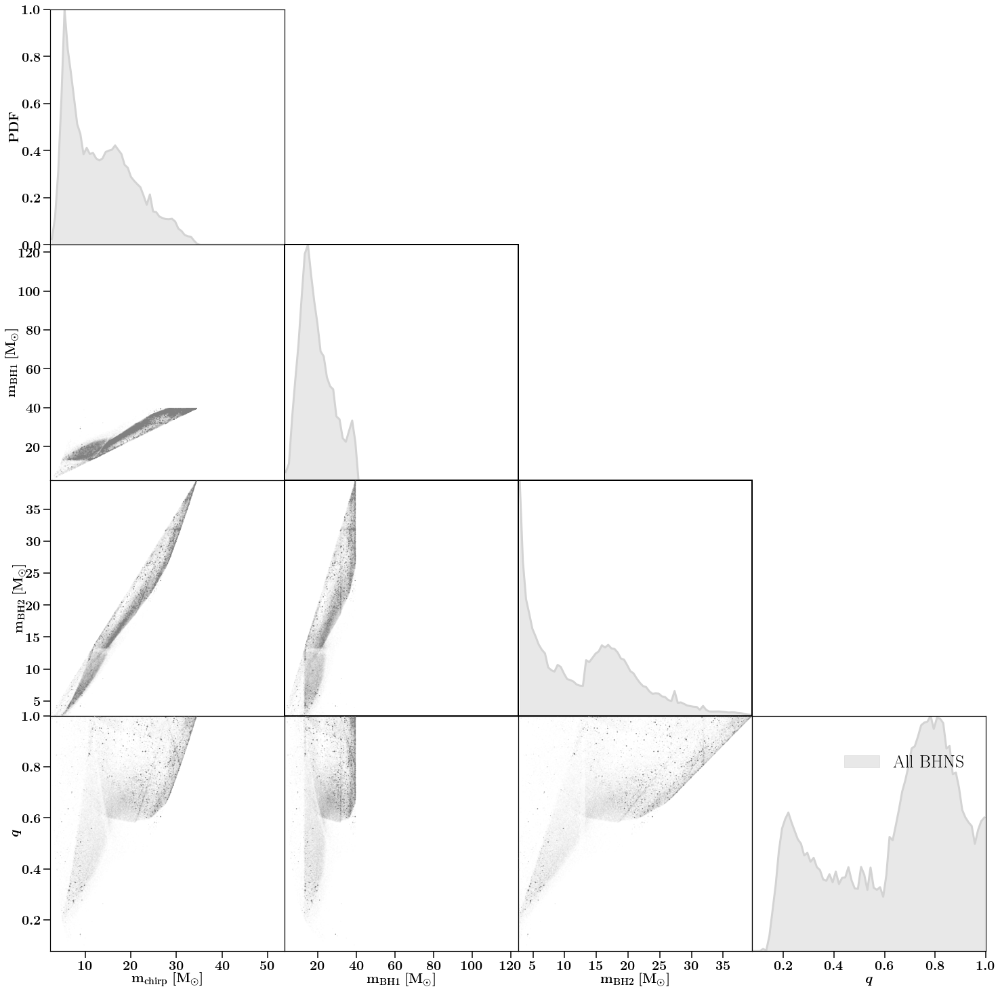

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


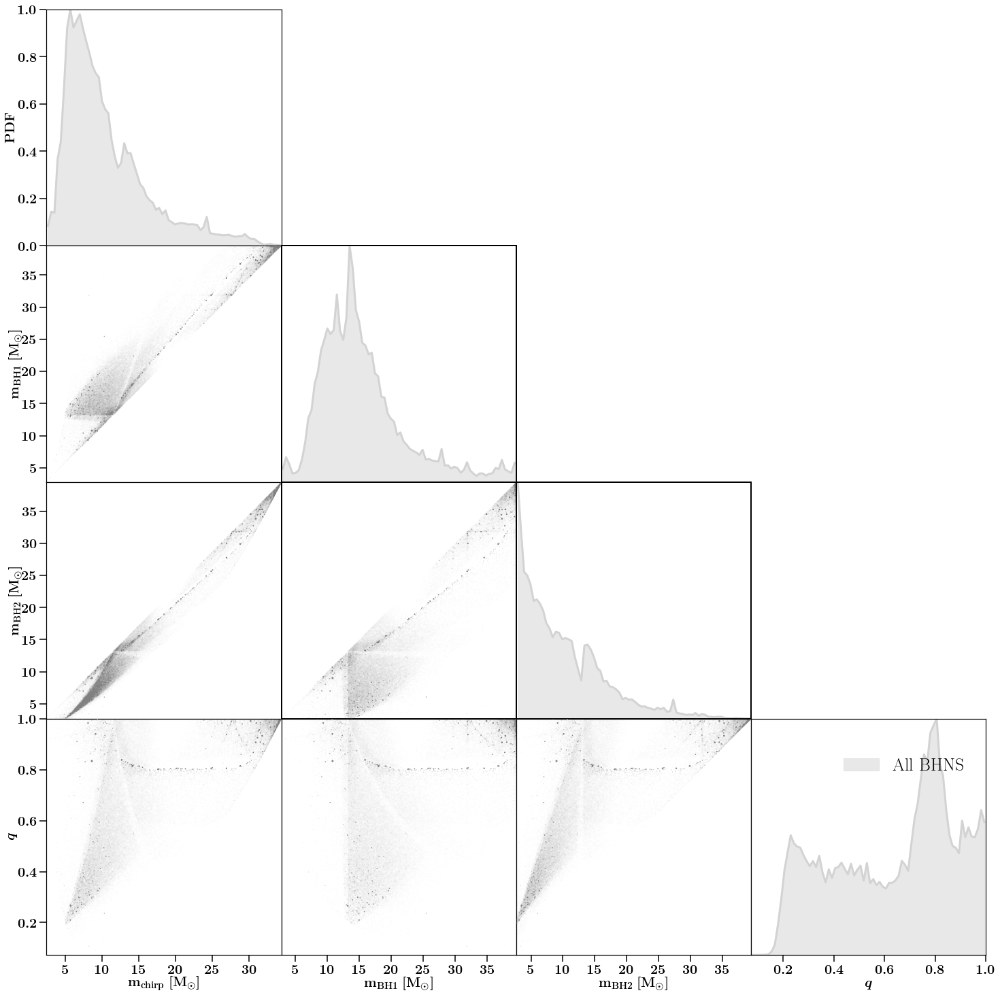

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


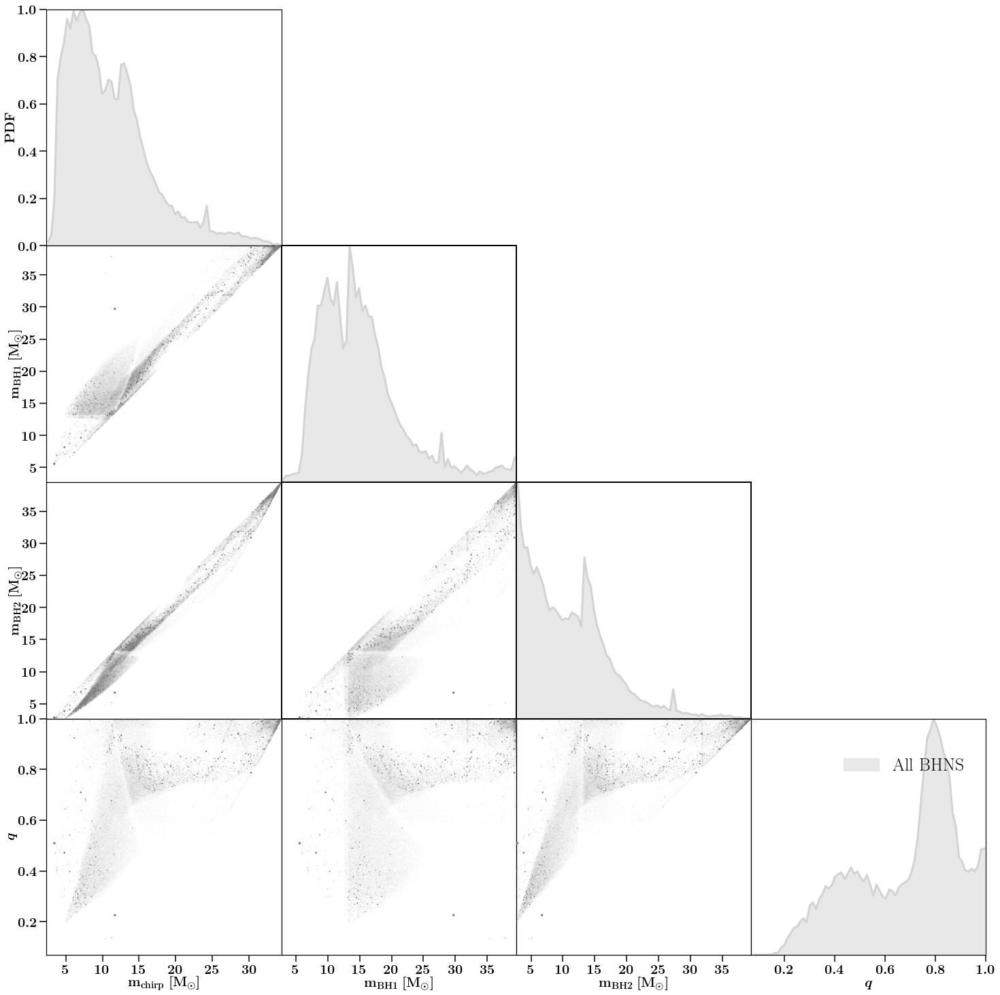

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


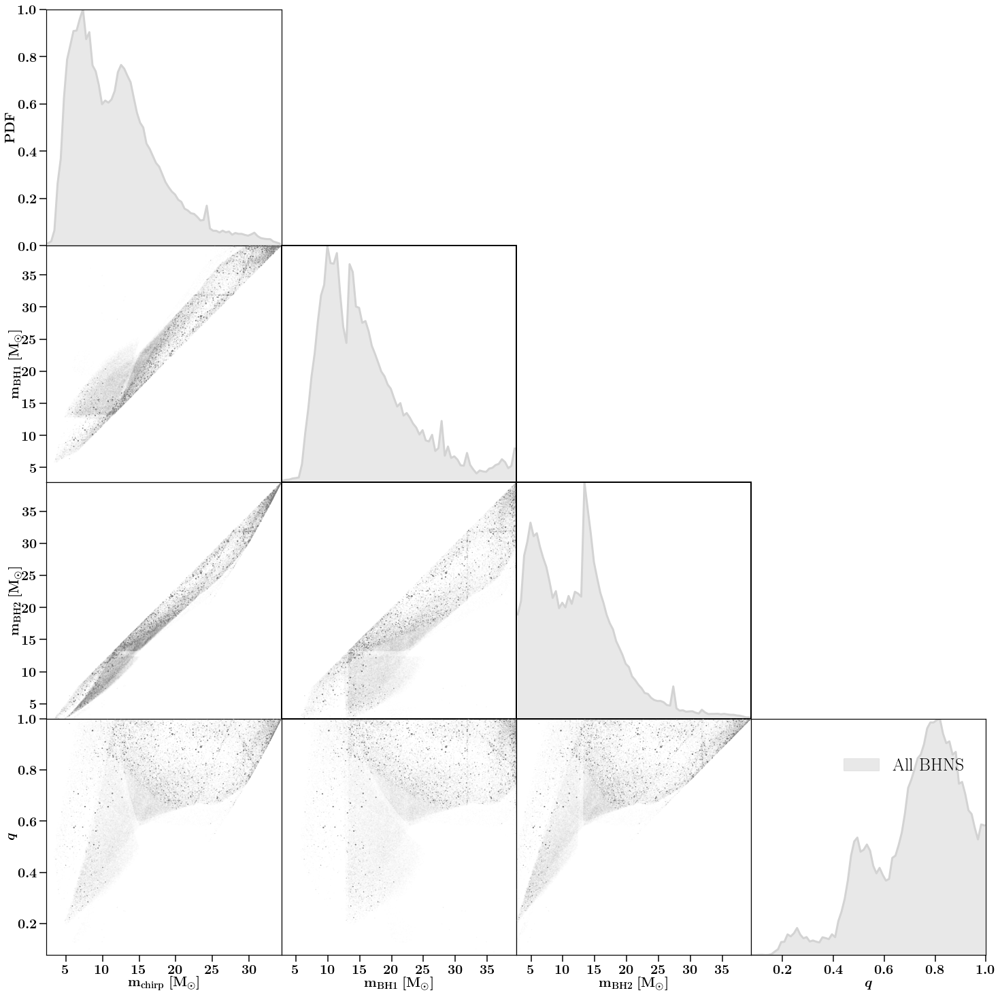

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


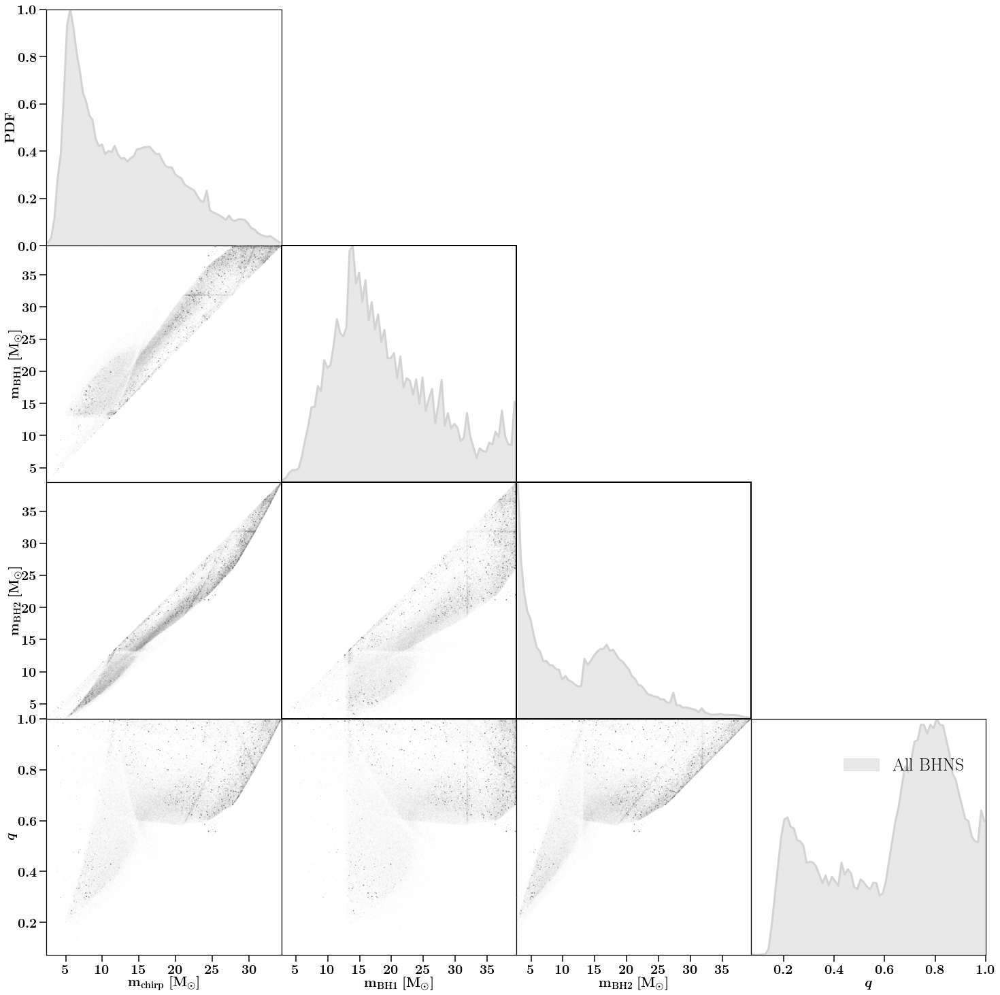

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


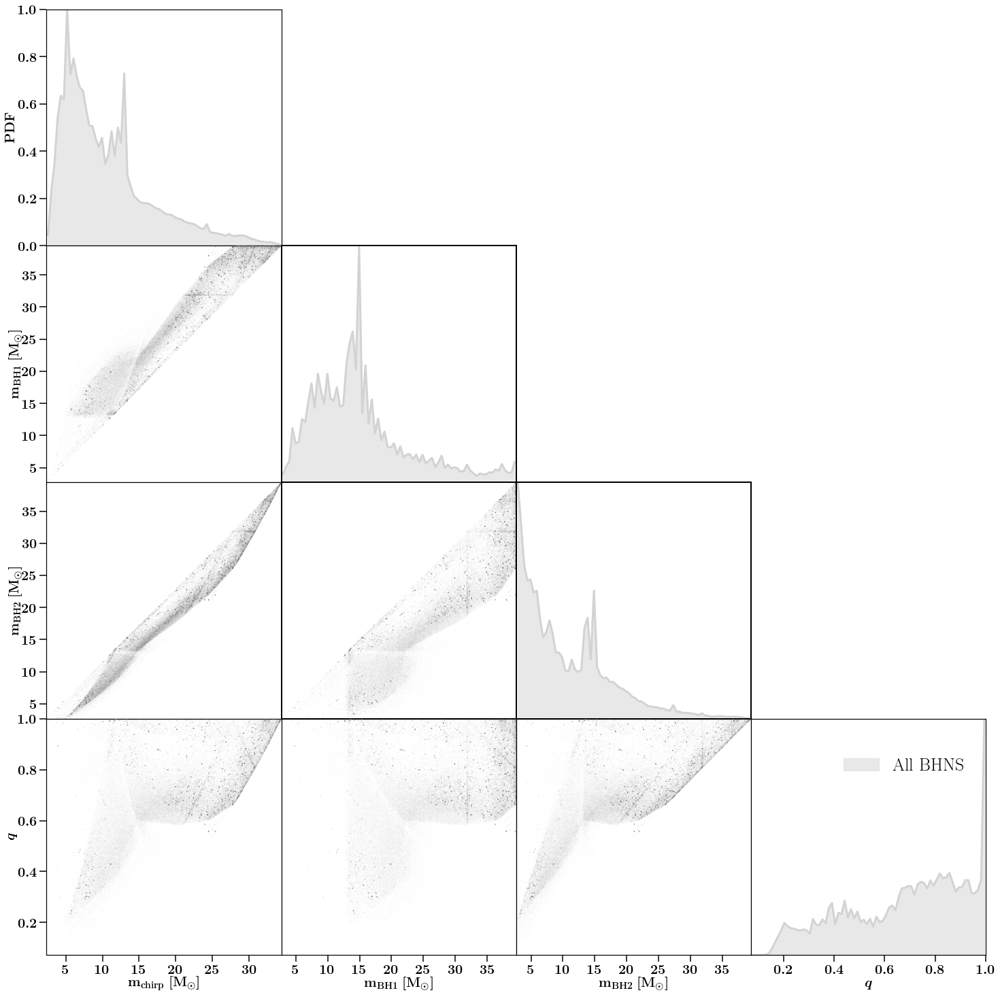

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


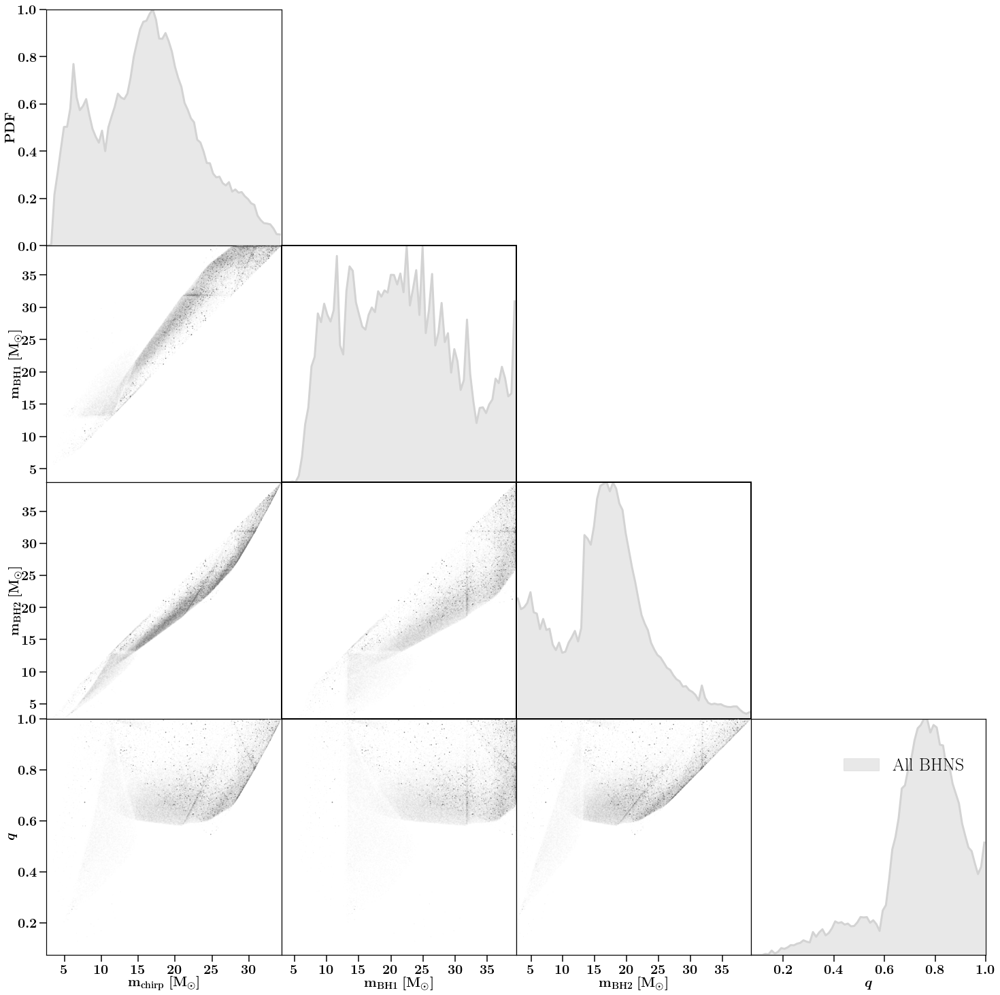

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


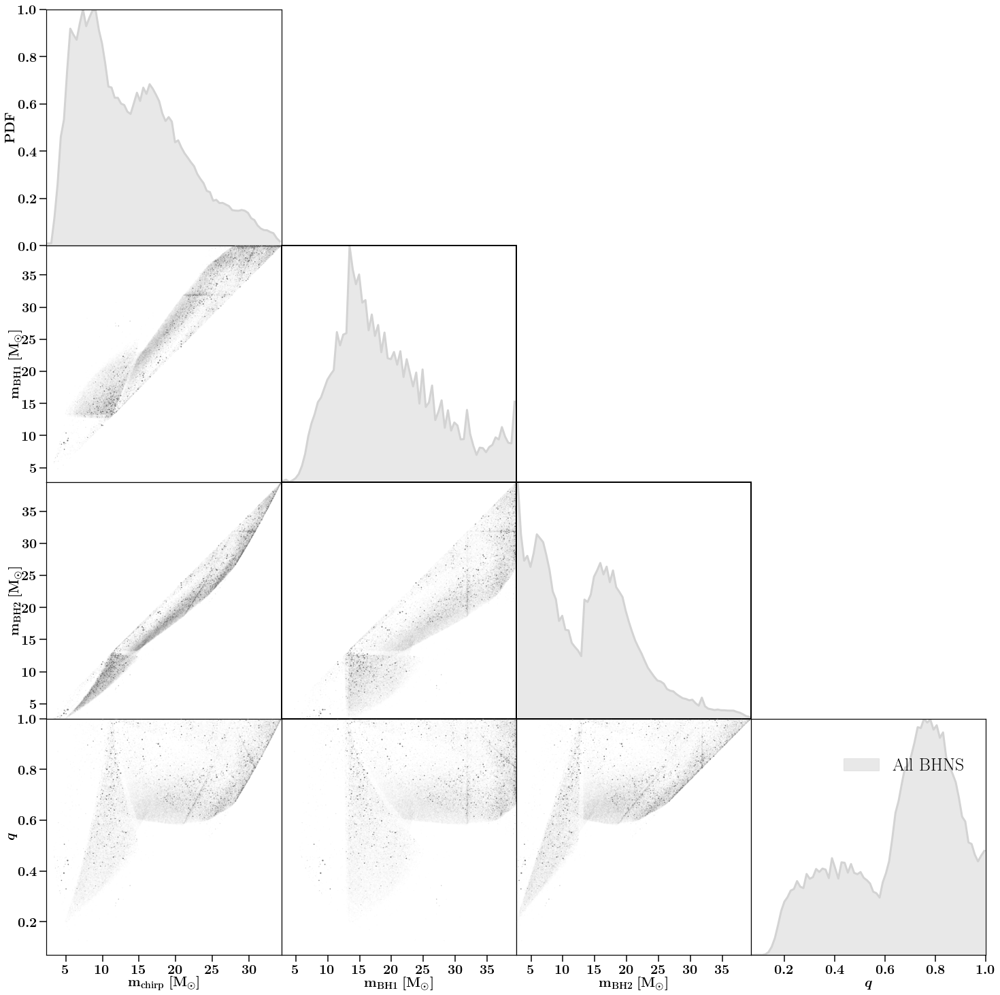

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


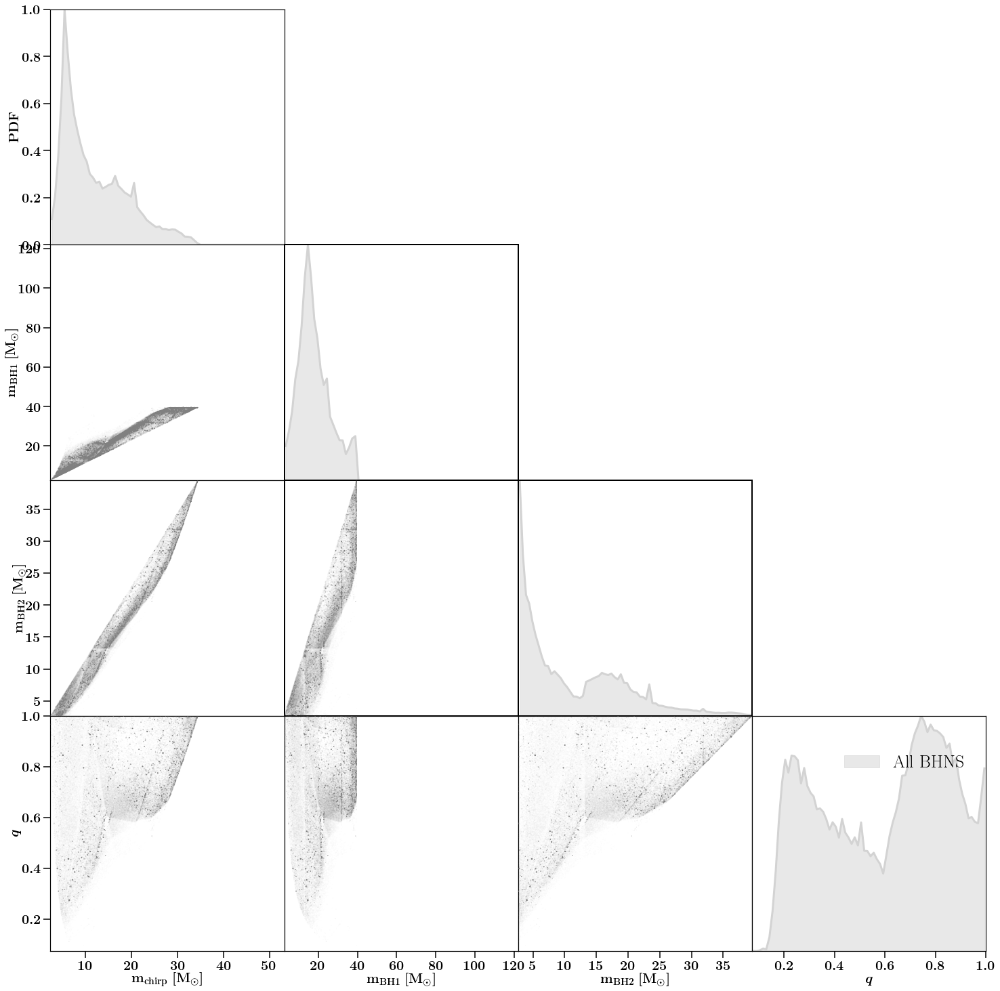

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


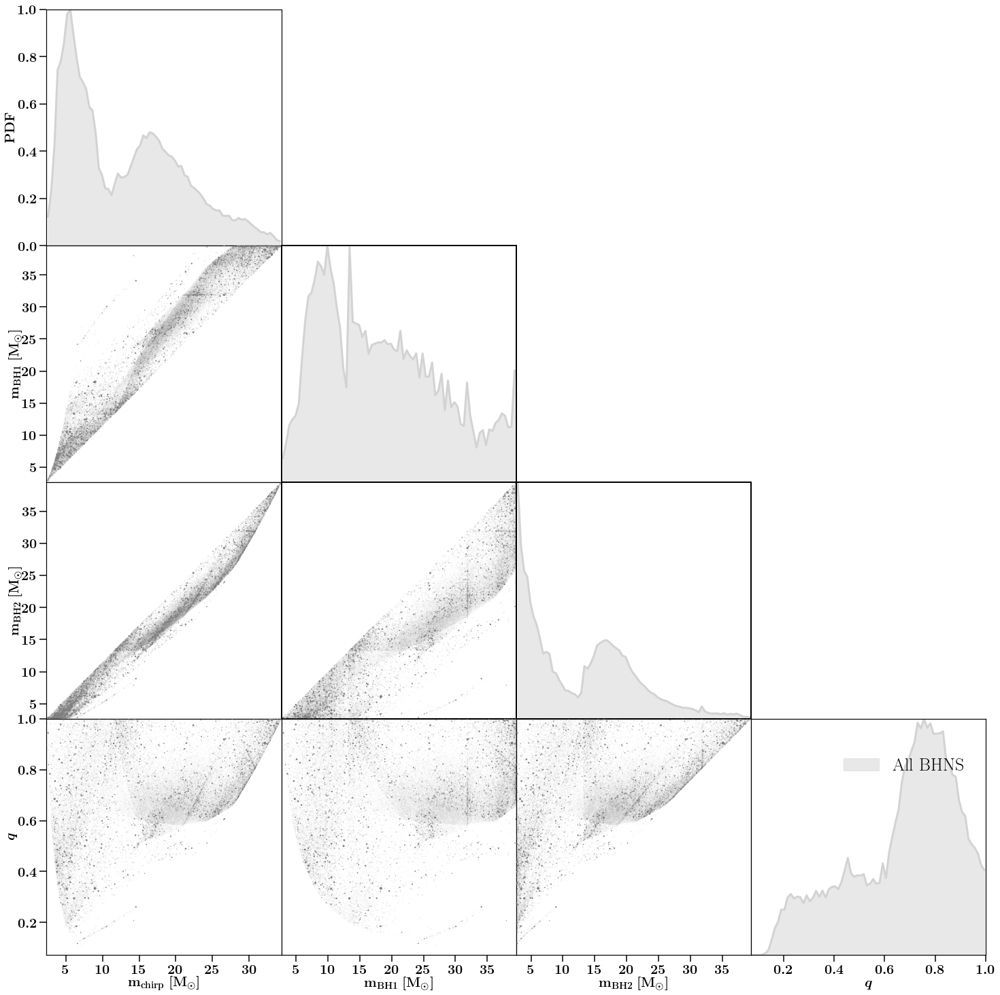

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


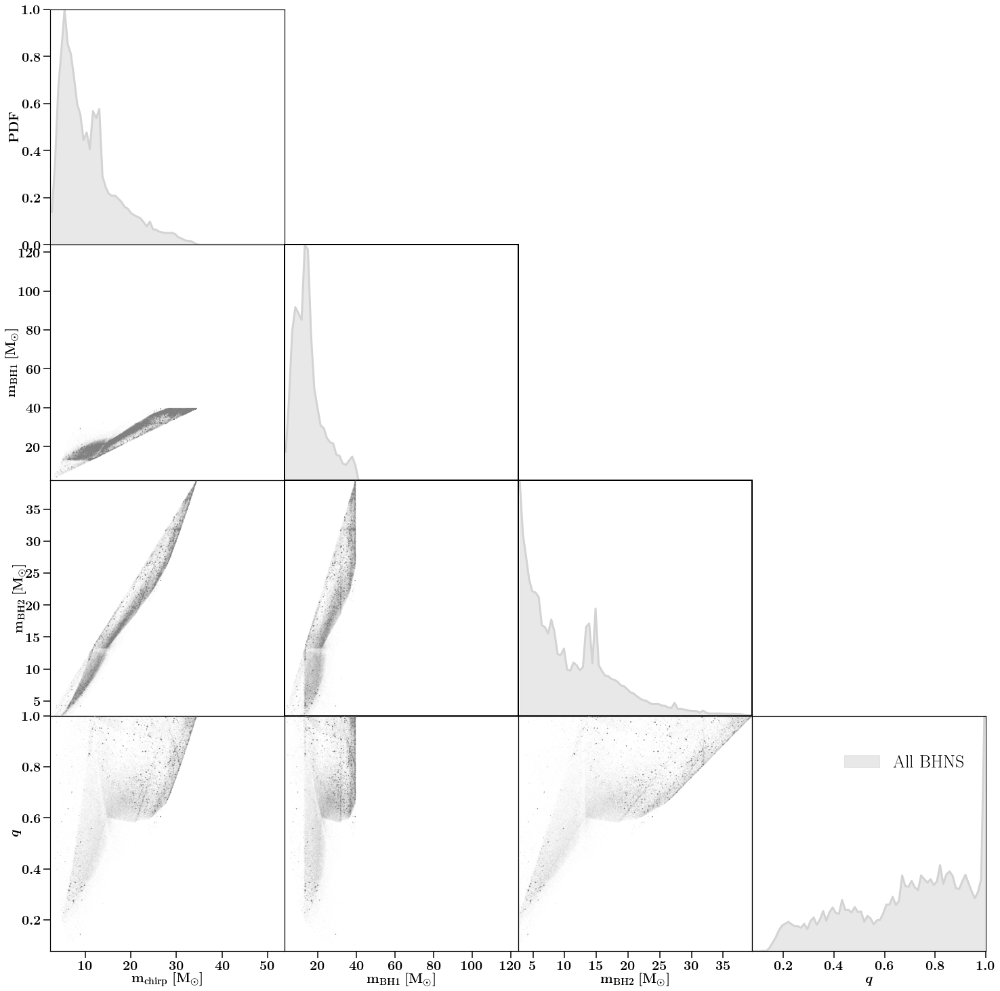

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


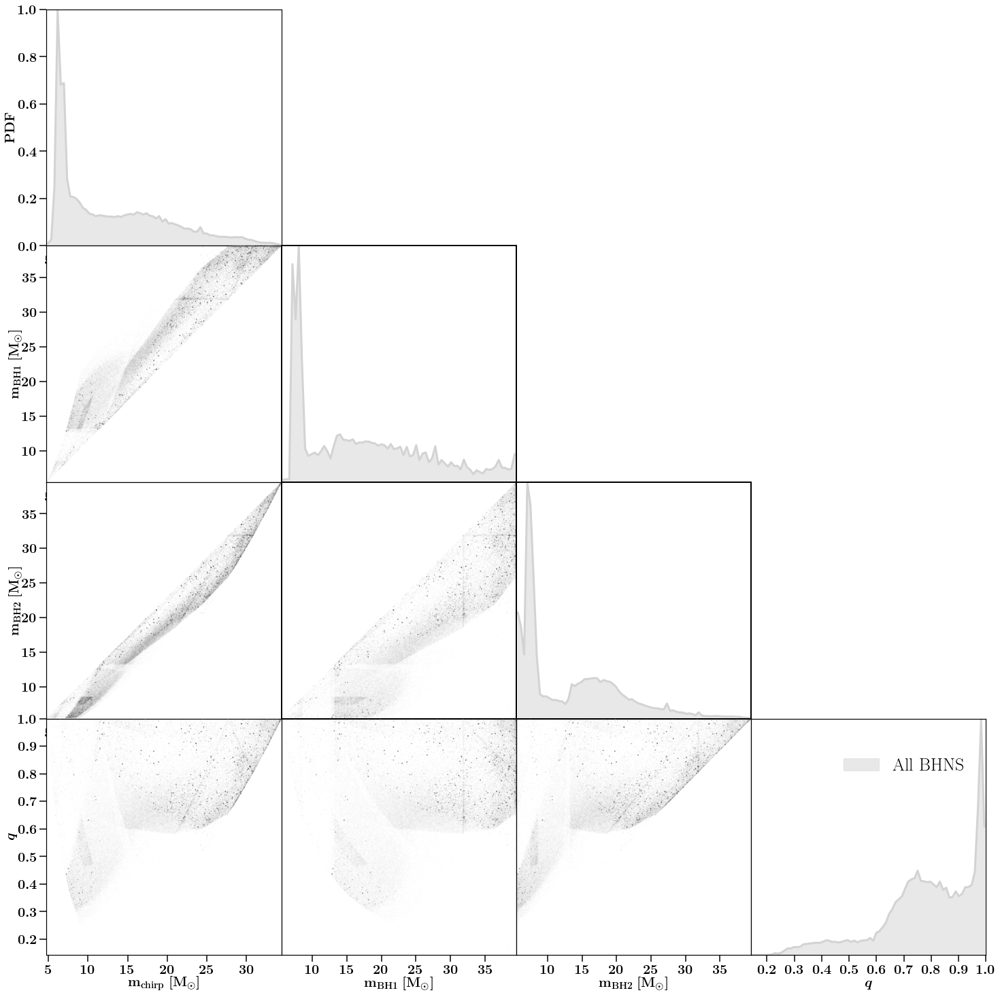

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


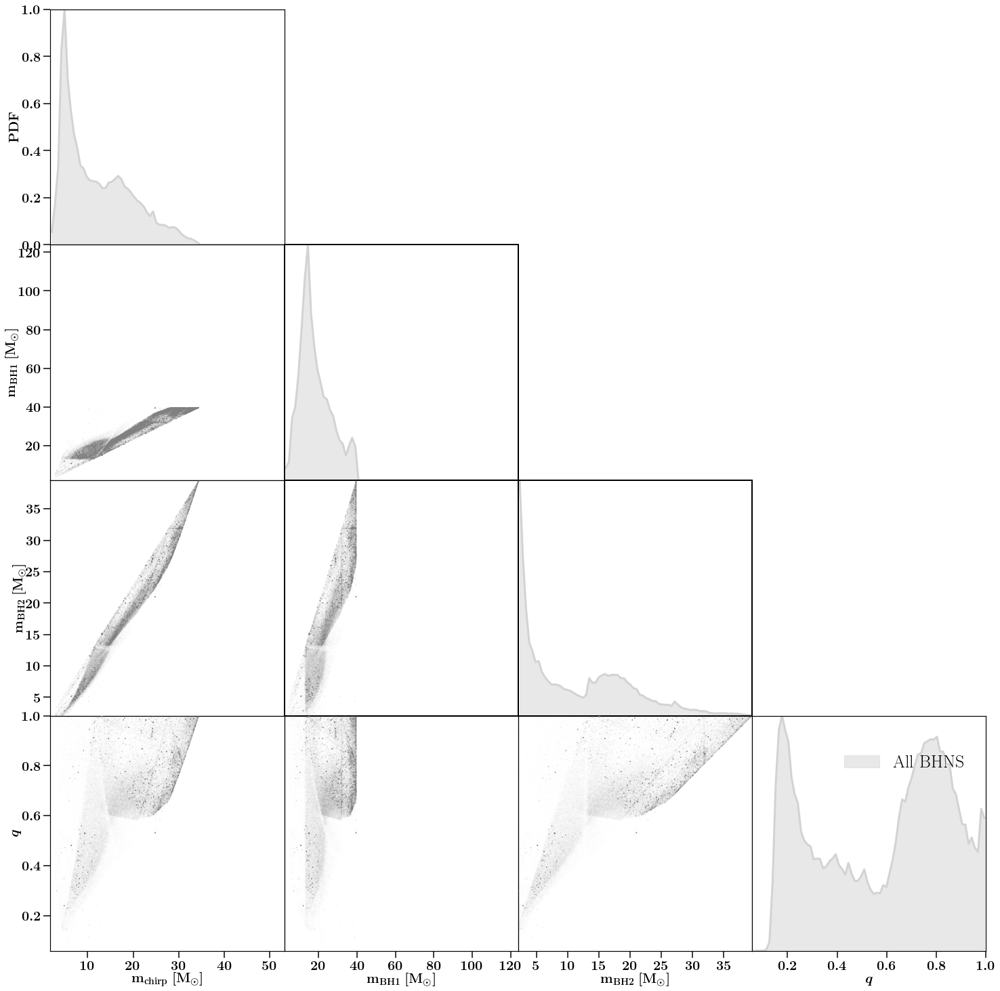

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


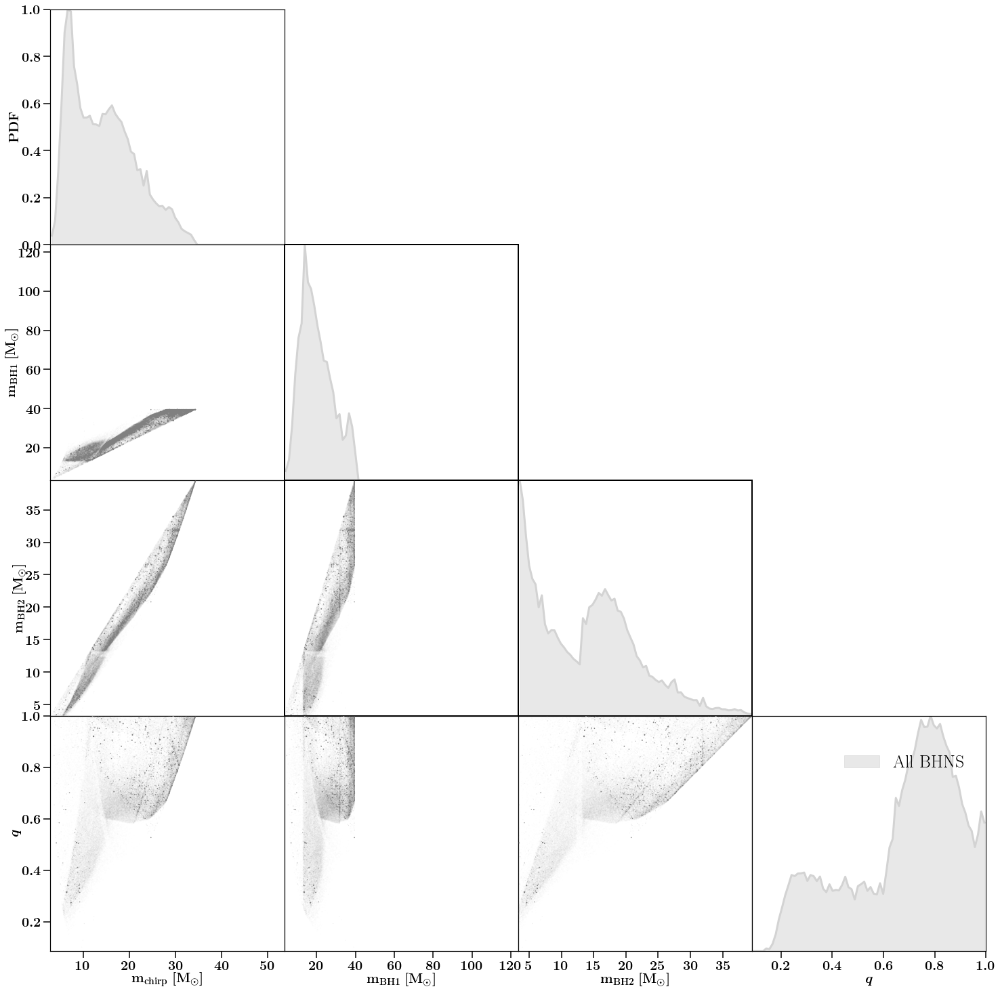

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


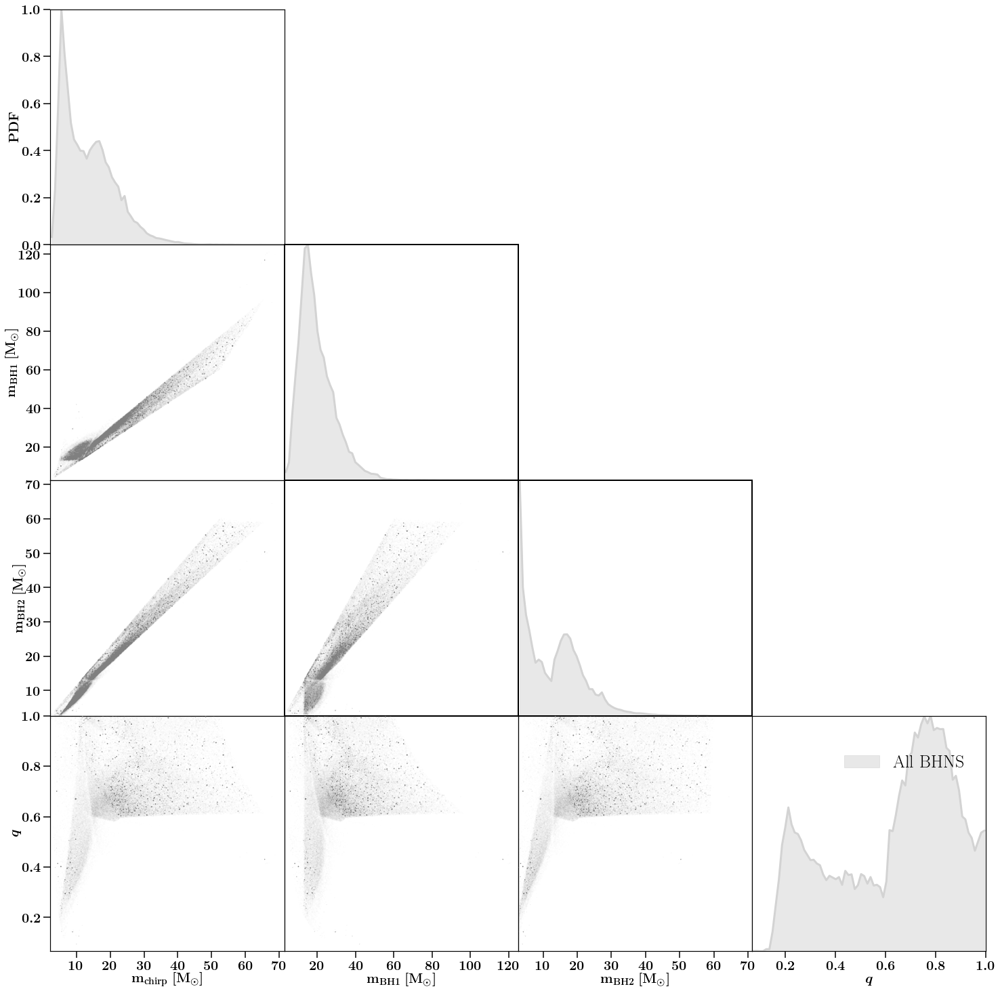

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


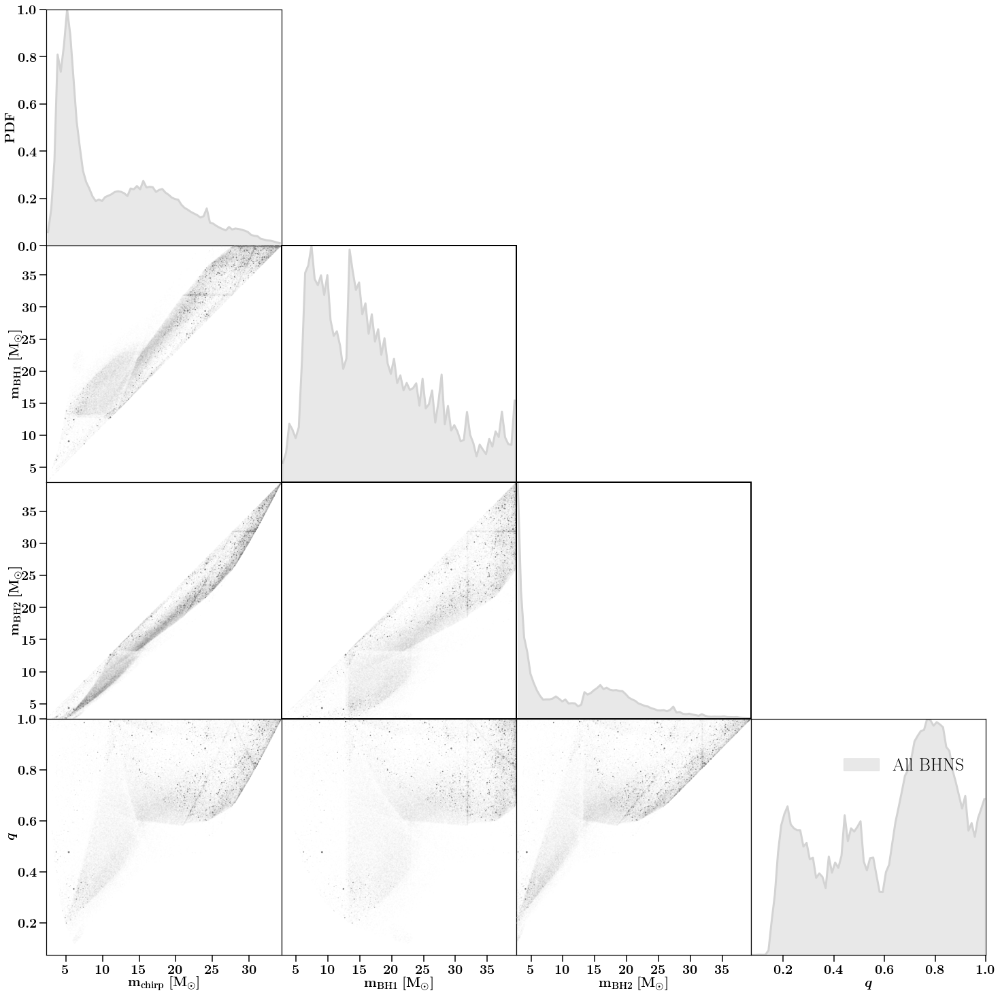

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


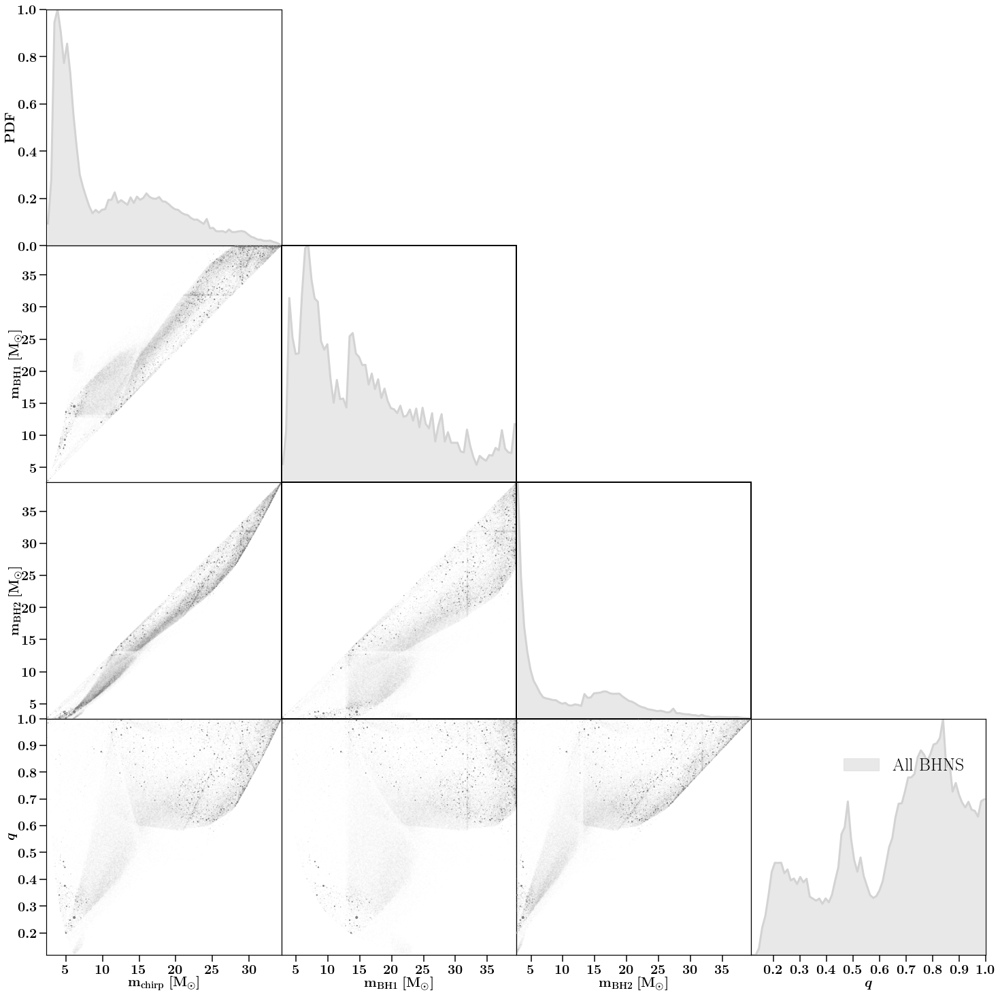

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


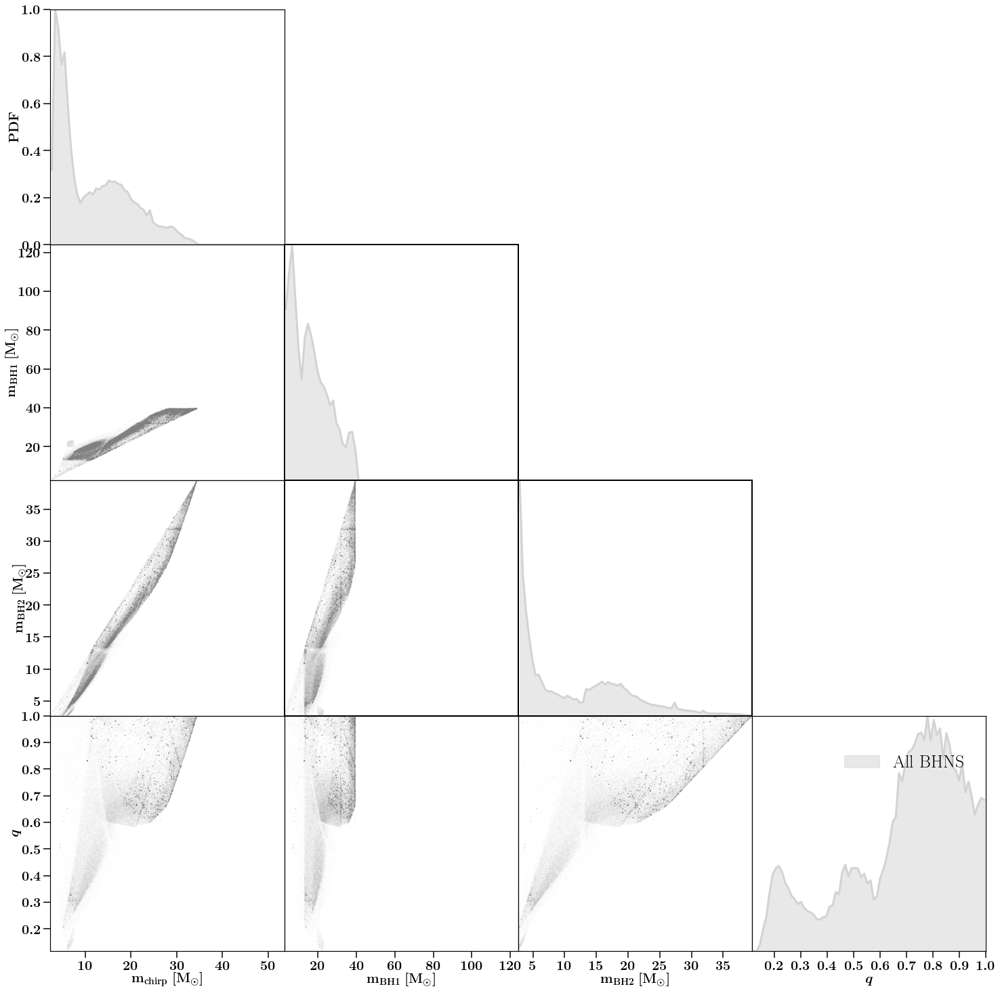

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


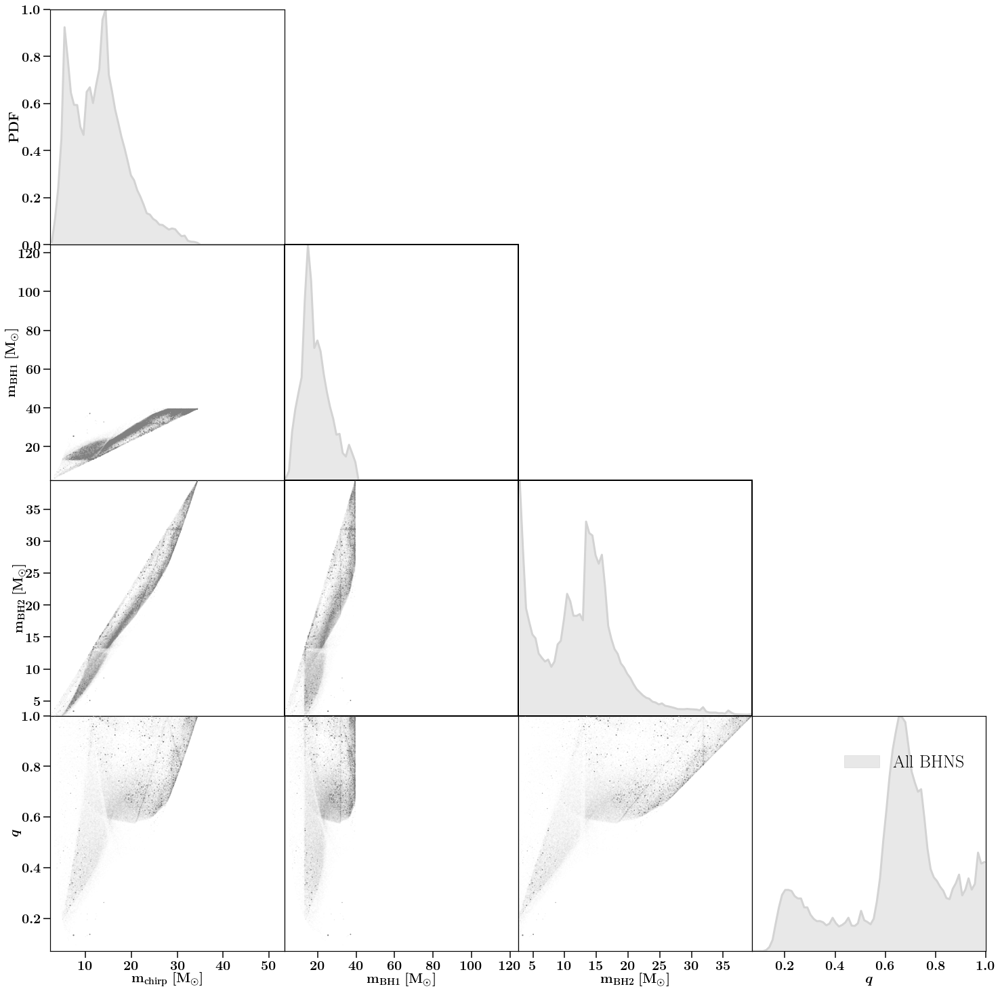

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


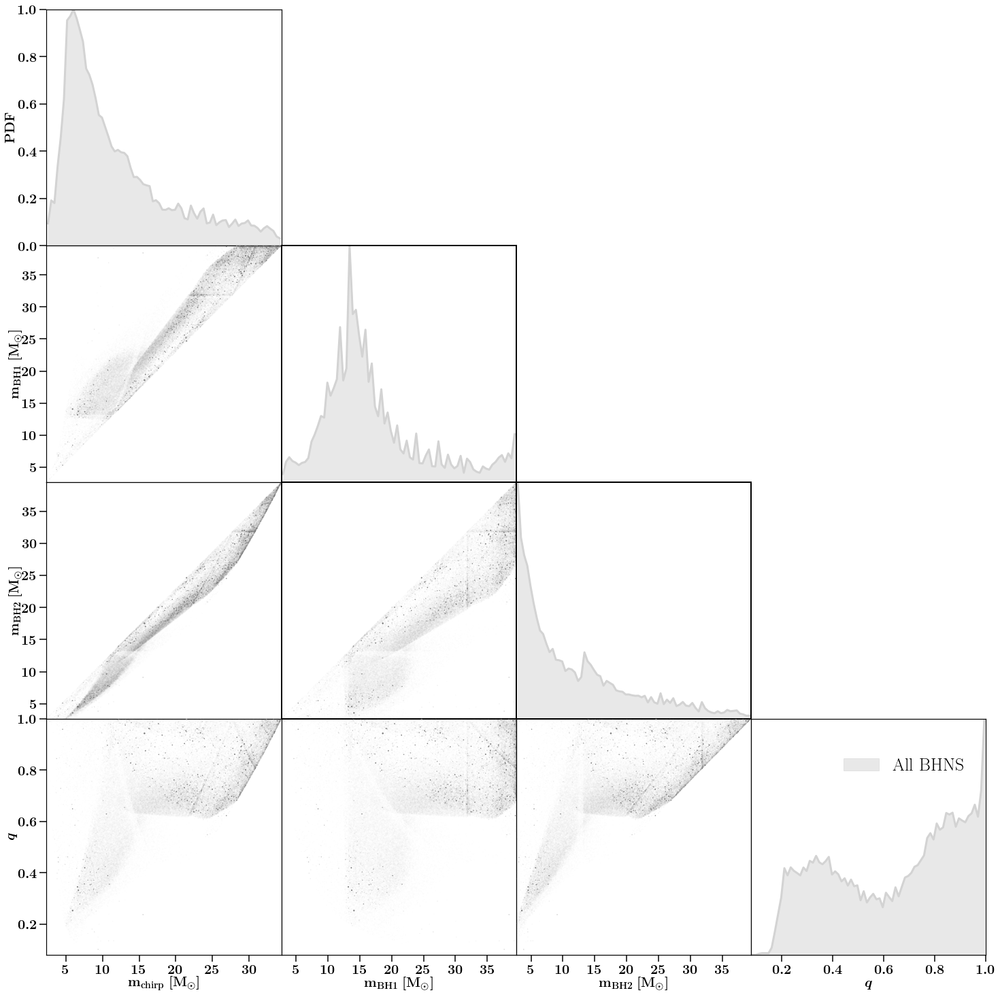

In [18]:
## MODEL I ## 

labellist=[ r'$M_{\rm{chirp}}$', r'$M_{\rm{BH1}} \ [M_{\odot}]$', r'$M_{\rm{BH2}} \ [M_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']   



for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:

# model='A'  # BINARY POPULATION SYNTHESIS MODEL label
    for mssfr in ['112']:




        f, ax= plt.subplots(ncols=4,nrows=4,figsize=(20,20), 
                          gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})
        plt.tight_layout()
        plt.subplots_adjust(wspace=0, hspace=0)
        plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, mssfr=mssfr)
        plt.savefig('./Scatter_Final_z0'  + model+ mssfr + '.png', transparent=False, bbox_inches="tight")
        plt.show()

In [19]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A', mssfr = '112'):
    """
    mssfr = '112' # mssfr that matches LIGO observed rates.
    
    """

    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1
        
    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()
        
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH2}} \ [\rm{M}_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1, M2, MassRatio]
    
    
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]

    
    

    
    
#     # GW lists:
#     print('obtaining GW200105 and GW200115 posteriors')
#     mass_1_source_GW200105, mass_2_source_GW200105, _, chirp_mass_source_GW200105, mass_ratio_GW200105, _, _ = get_GW_posteriors(GW_list=['GW200105_162426'])
#     mass_1_source_GW200115, mass_2_source_GW200115, _, chirp_mass_source_GW200115, mass_ratio_GW200115, _, _ = get_GW_posteriors(GW_list=['GW200115_042309'])
    
#     varlist_GW200115 = [chirp_mass_source_GW200115, mass_1_source_GW200115, mass_2_source_GW200115, mass_ratio_GW200115]
#     varlist_GW200105 = [chirp_mass_source_GW200105, mass_1_source_GW200105, mass_2_source_GW200105, mass_ratio_GW200105]
    
    
    fs_l = 20 # label fontsize
    
    
    
    print('plotting corner plot')
#     cGW1 = 'lightskyblue' 
#     cGW0 = 'orange'
    LEGEND = True 
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 75)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=3, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.5)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=3, ls=':')   
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=3, ls=':')  
                
                
                
                
                #### LVK sources ###
#                 nrbins = 50 
                
#                 hist, bin_edges = np.histogram( varlist_GW200105[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
# #                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=5)   
# #                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=4, alpha=0.2)
                
#                 hist, bin_edges = np.histogram(varlist_GW200115[jj], bins=nrbins)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=5)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=4, alpha=0.2)
                #######################
                
                
                
                
                # BEAUTIFY: 
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                if param_x== r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x==  r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                    
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)                    
                    
                if param_x==r'$q $':
                    xx = [-100, -50]
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.5, label='All BHNS')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
                    ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.65, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=r'$\textbf{PDF}$', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
                # cut axes for chirp and MBH mass 
                if param_x==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 27)
                if param_x== r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_xlim(jj_minn, 6.2)
                if param_x==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_xlim(0.9, jj_maxx)  
                    
                if param_y==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 27)
                if param_y==r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
                    axe[ii,jj].set_ylim(ii_minn, 6.2)                
                if param_y==  r'$m_{\rm{NS}} \ [M_{\odot}]$':
                    axe[ii,jj].set_ylim(0.9, ii_maxx)  
                    
                    
                    
                x = varlist[jj] #np.linspace(0,1,100)
                y = np.ones_like(varlist[jj])

                # plot 90% credible interval from LIGO posteriors
#                 sns.kdeplot(x=varlist_GW200105[jj][0:], y=varlist_GW200105[ii][0:], ax=ax[ii, jj],  color='orange', linewidth=3, shade=False, levels=[0.1], bw_method=0.3, zorder=11)
#                 sns.kdeplot(x=varlist_GW200115[jj][0:], y=varlist_GW200115[ii][0:], ax=ax[ii, jj],  color='lightskyblue', linewidth=3,  shade=False, levels=[0.1], bw_method=0.3, zorder=11)

                ax[ii,jj].scatter(varlist[jj][0:], varlist[ii][0:], s=140*w[0:], color='gray', zorder=4)
                
                # overplot with LIGO observations matches within simulation: show with scatter points 
#                 ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
#                 ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)
                
                if (ii==(len(var)-1)):
                    print(ii)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 

    
    
    # add a color map for the gray contour lines 
    cmap = cmap_from_colour('gray')
    scatter = ax[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
    inset_ax = ax[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
    cbar = f.colorbar(scatter, ax=ax[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
    cbar.set_ticklabels(level_labels)
    cbar.ax.tick_params(labelsize=26)                    

    ax[1,2].annotate('All BHNS', xy=(1.0, 0.72), xycoords="axes fraction",
                     fontsize=fs+10, color="black", ha="center", va="bottom")                     
                    
                    
                    
                    

                    
                    
                    
                    

                    
                    
                    
  






plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


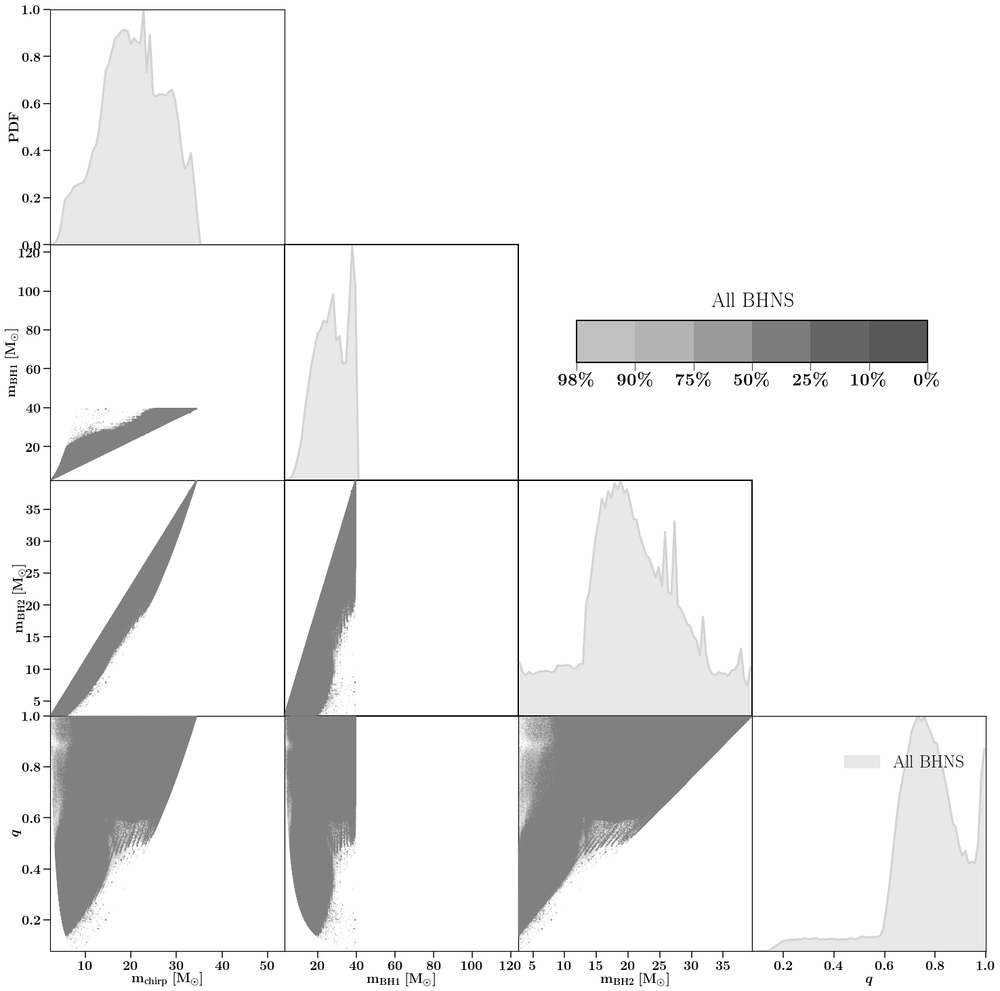

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


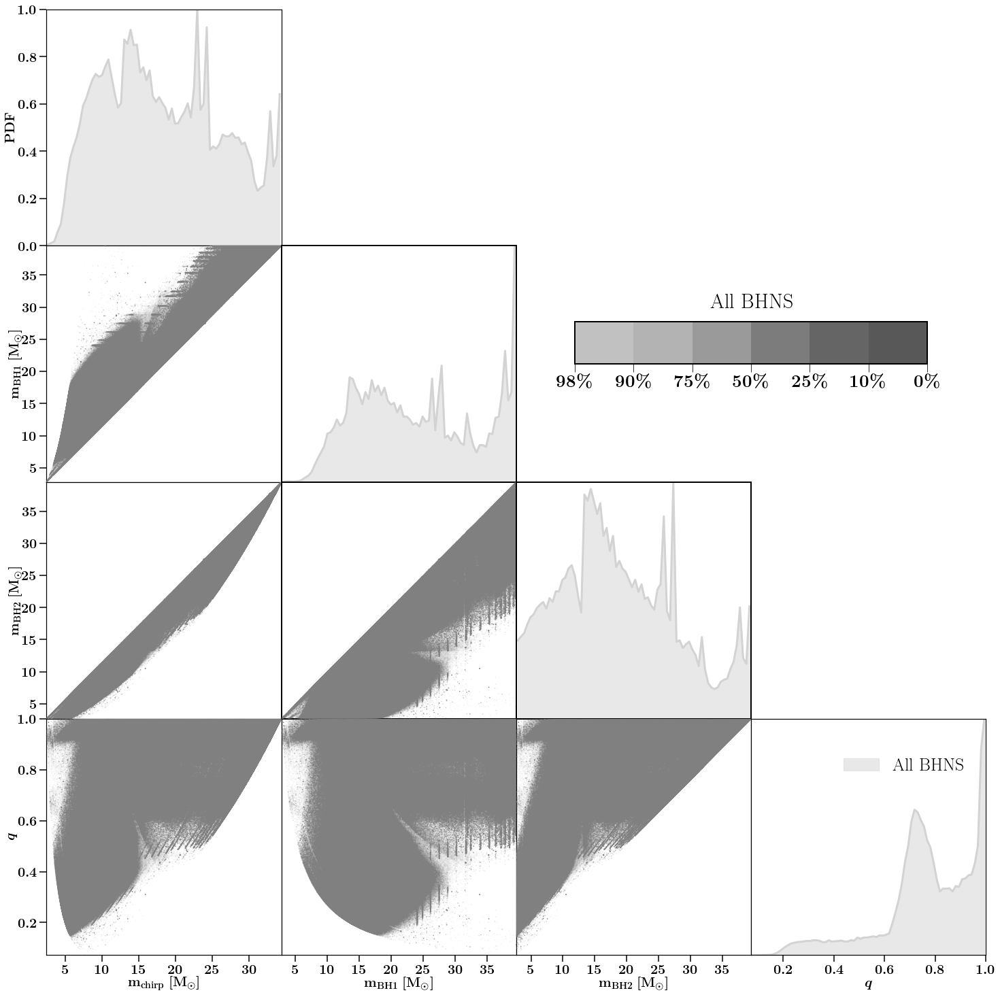

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


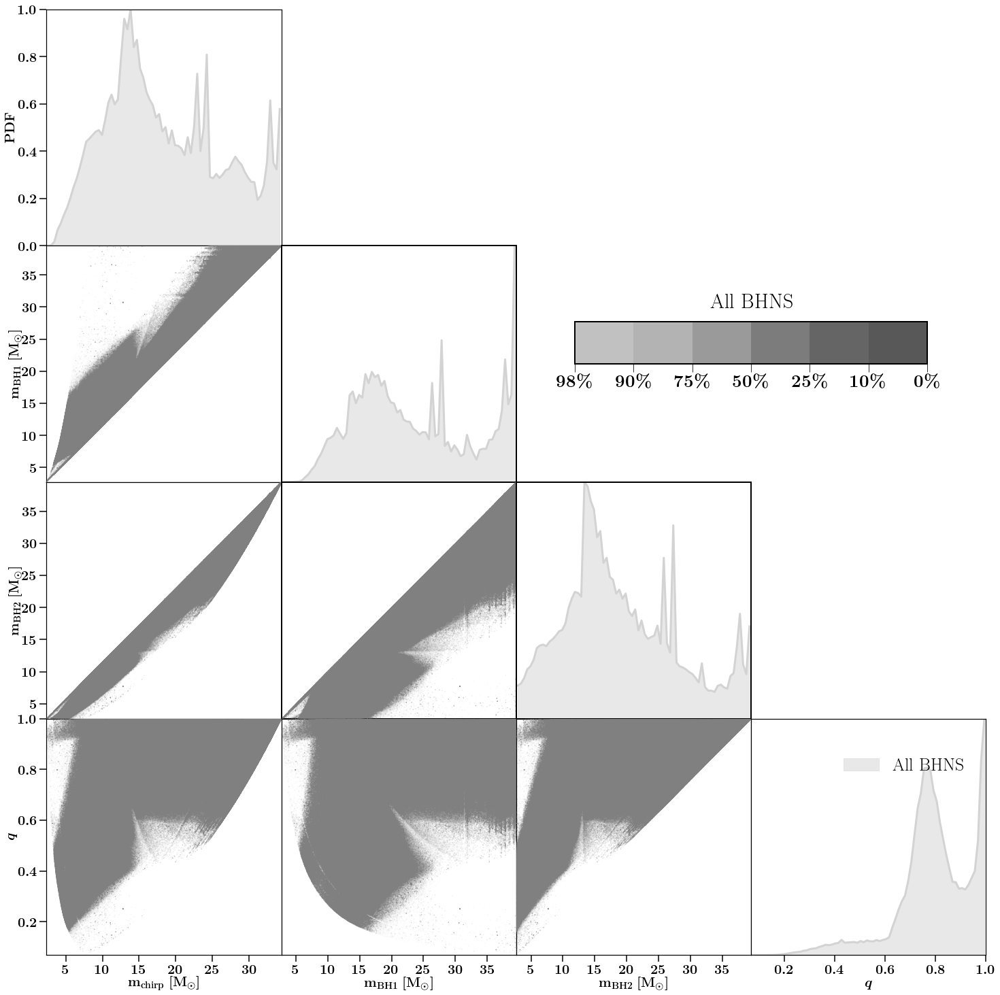

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


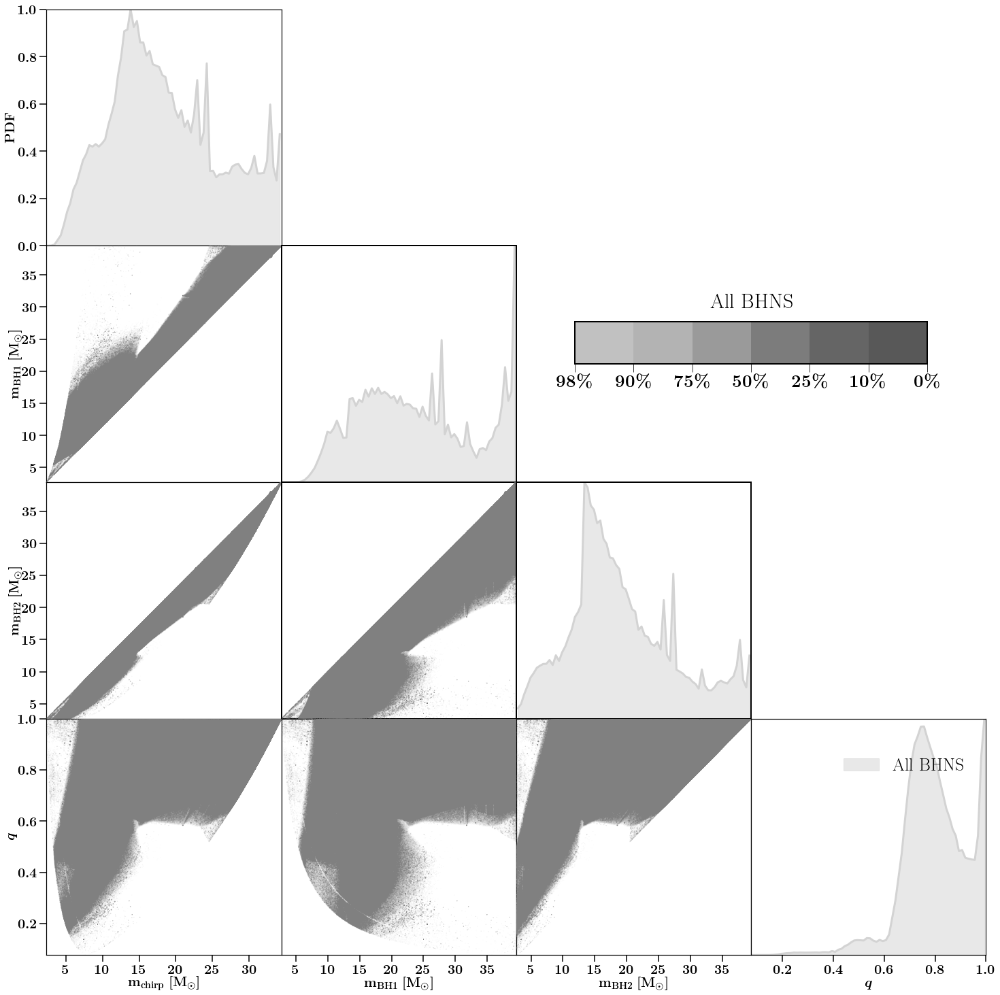

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


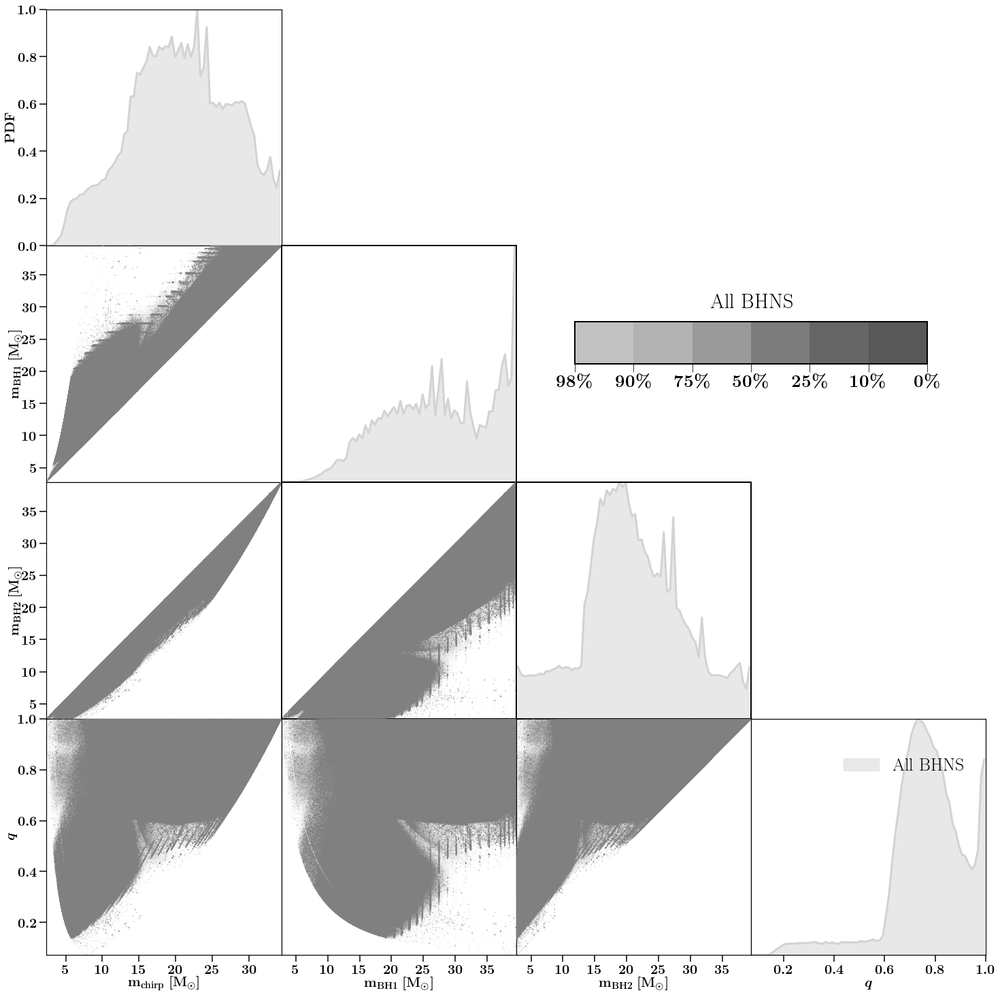

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


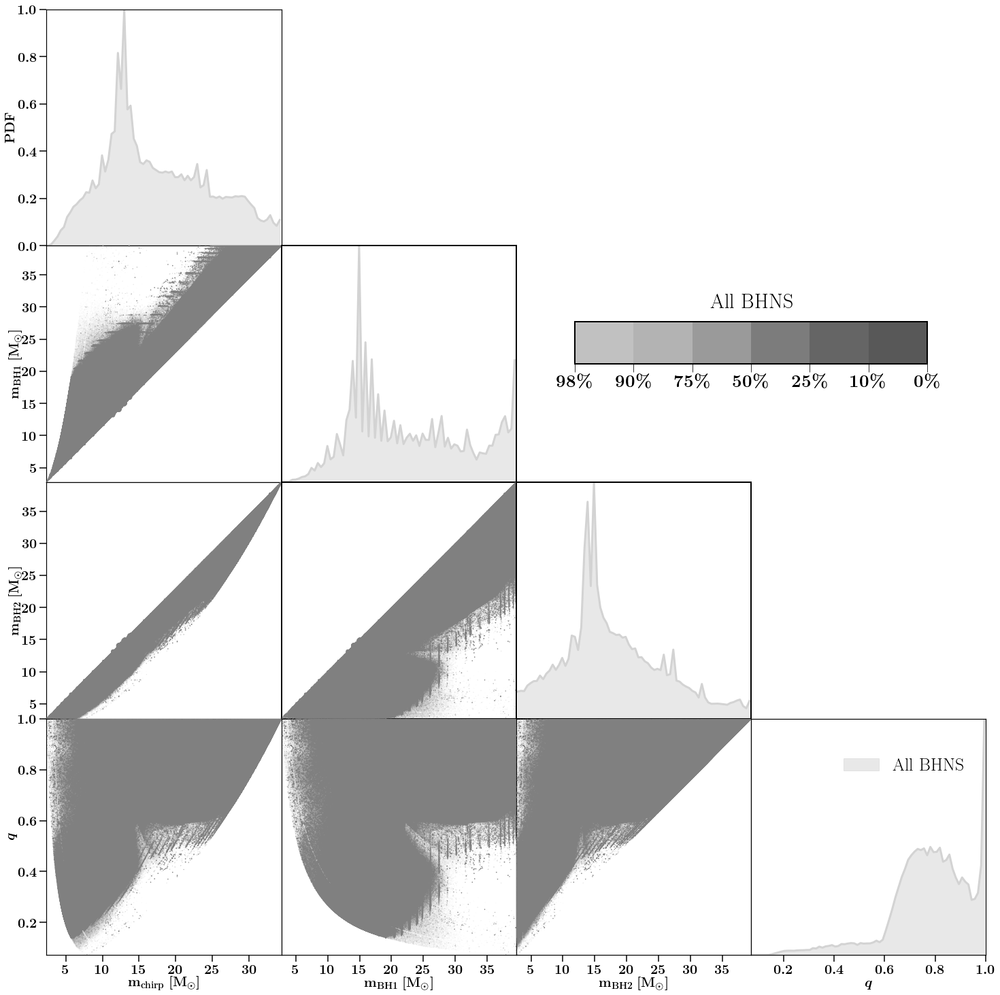

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


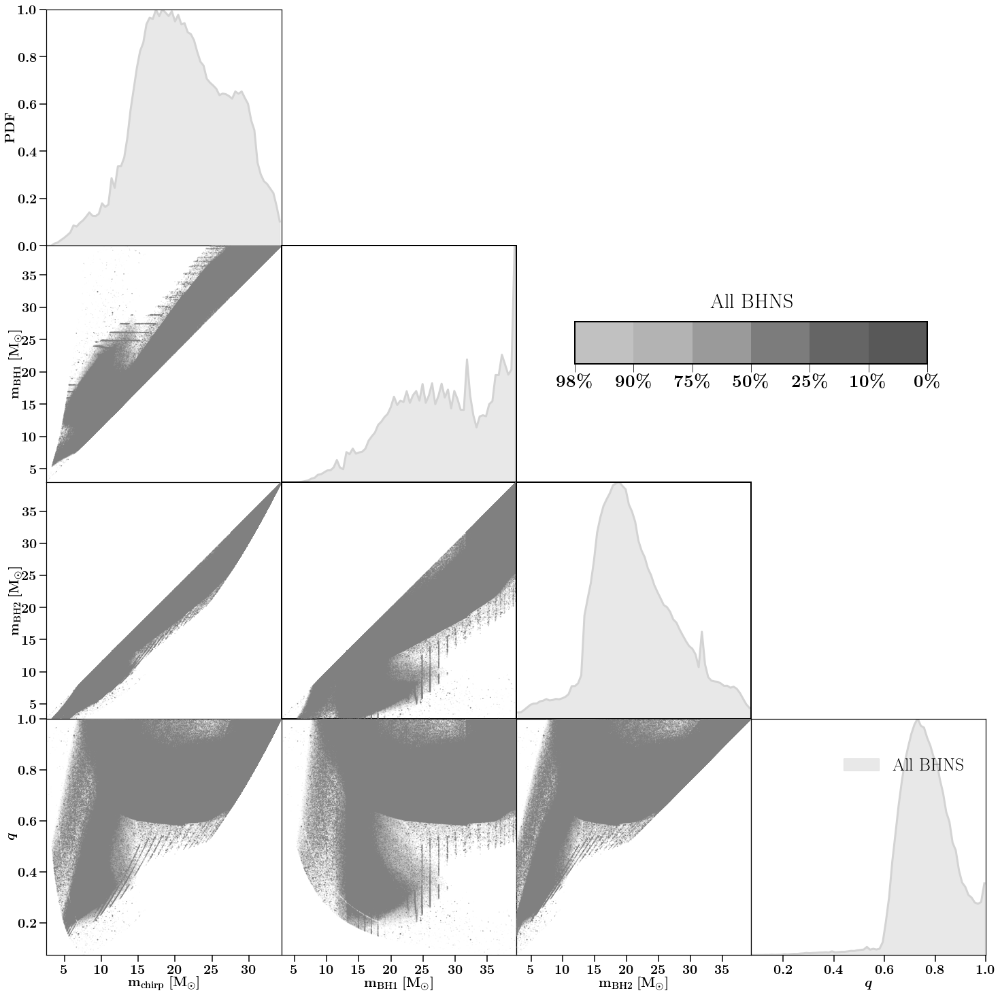

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


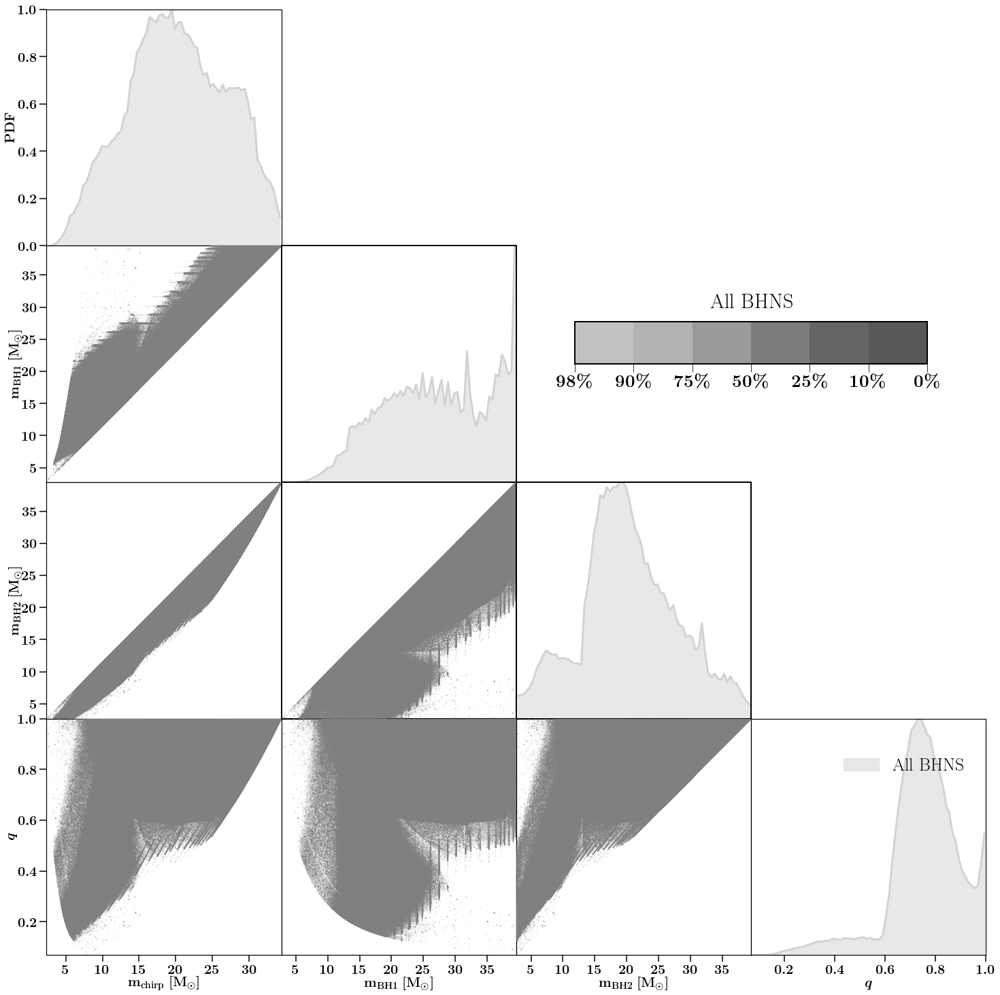

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


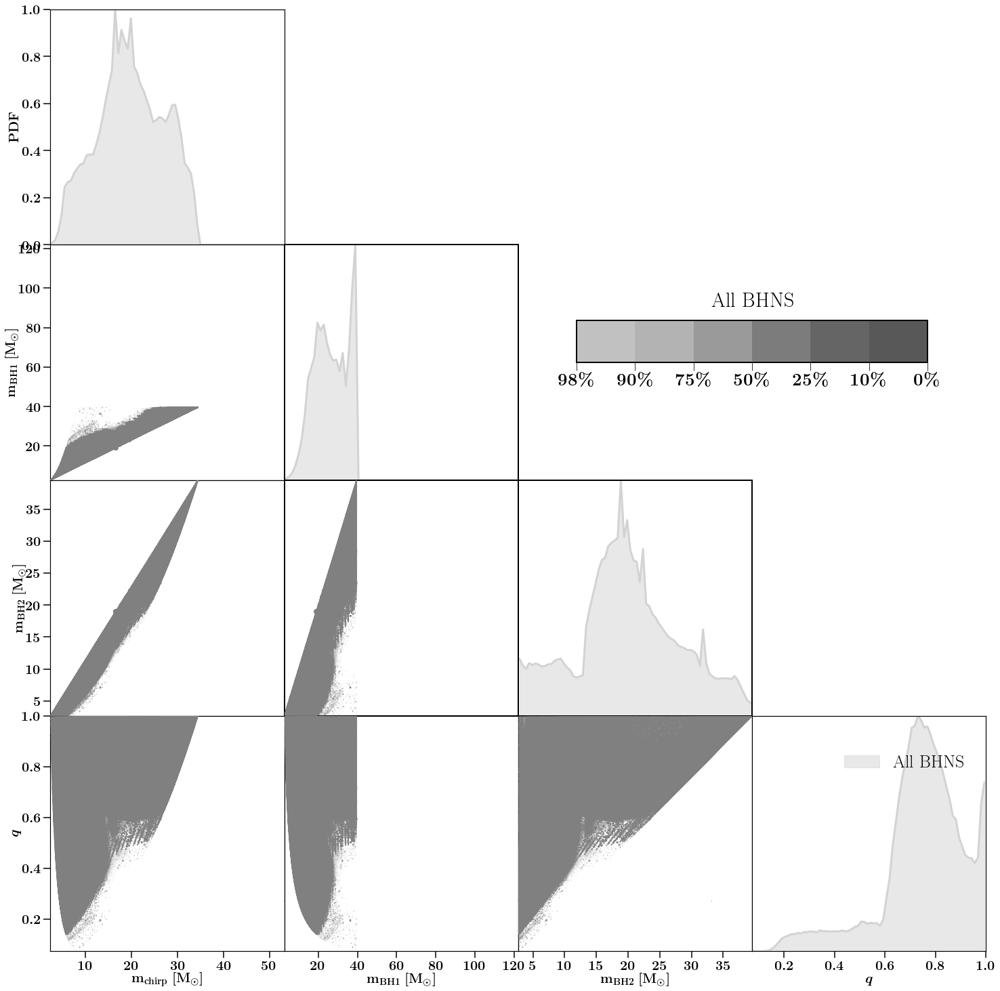

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


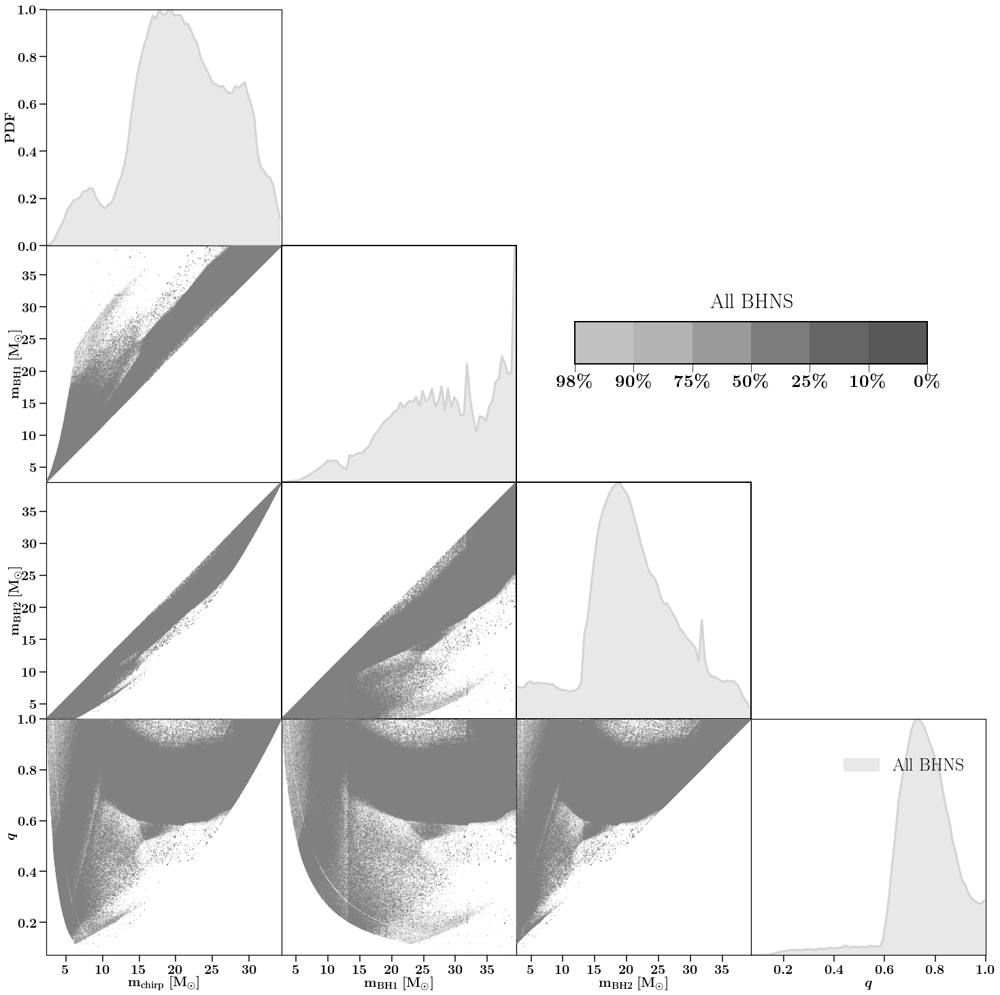

plotting corner plot
ii,jj= 0 0
ii,jj= 1 0
ii,jj= 2 0
ii,jj= 3 0
3
ii,jj= 1 1
ii,jj= 2 1
ii,jj= 3 1
3
ii,jj= 2 2
ii,jj= 3 2
3
ii,jj= 3 3


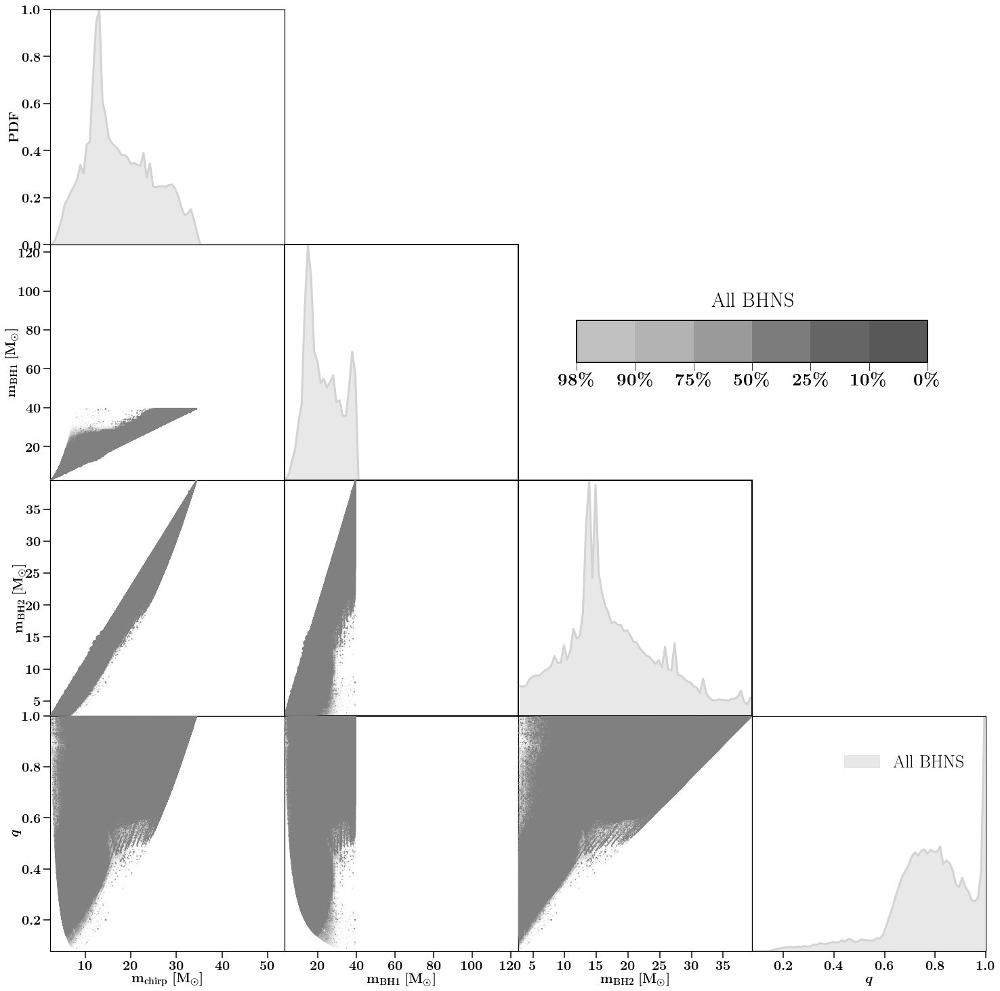

OSError: Unable to create file (unable to open file: name = '/Volumes/Andromeda/DATA/AllDCO_bugfix/rapid/COMPASCompactOutput_BBH_L.h5', errno = 2, error message = 'No such file or directory', flags = 15, o_flags = a02)

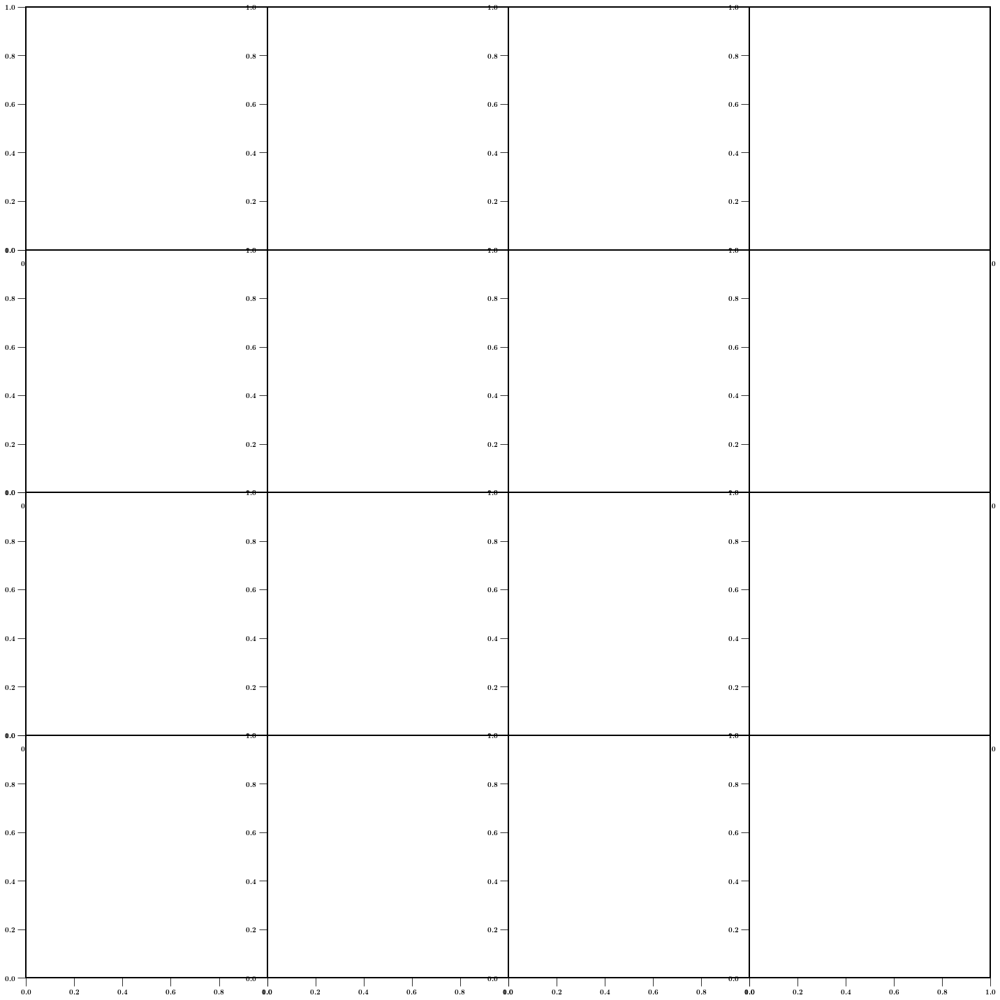

In [20]:
## MODEL I ## 

labellist=[ r'$M_{\rm{chirp}}$', r'$M_{\rm{BH1}} \ [M_{\odot}]$', r'$M_{\rm{BH2}} \ [M_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']   



for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:

    # model='A'  # BINARY POPULATION SYNTHESIS MODEL label
    for mssfr in ['112']:




        f, ax= plt.subplots(ncols=4,nrows=4,figsize=(20,20), 
                          gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})
        plt.tight_layout()
        plt.subplots_adjust(wspace=0, hspace=0)
        plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, mssfr=mssfr)
        plt.savefig('./Scatter_Final_LVK_Pdetected'  + model+ mssfr + '.png', transparent=False, bbox_inches="tight")
        plt.show()